# Projeto Final - WW_stats - A81824

Antes de correr fazer:
* pip install ploty
* pip install char_studio
* pip install plotly_express
* pip install request

## Tracking do crescimento de casos de COVID-19

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

import plotly_express as px
import plotly.graph_objects as go
import chart_studio.plotly as py
import request
import urllib

In [6]:
url='https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
file = urllib.request.urlopen(url)
dataCOV = pd.read_csv(url)

dataCOV = dataCOV.replace({'0':np.nan, 0:np.nan})
dataCOV

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20
0,NaN,Afghanistan,33.000000,65.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,7653.0,8145.0,8676.0,9216.0,9998.0,10582.0,11173.0,11831.0,12456.0,13036.0
1,NaN,Albania,41.153300,20.168300,NaN,NaN,NaN,NaN,NaN,NaN,...,949.0,964.0,969.0,981.0,989.0,998.0,1004.0,1029.0,1050.0,1076.0
2,NaN,Algeria,28.033900,1.659600,NaN,NaN,NaN,NaN,NaN,NaN,...,7377.0,7542.0,7728.0,7918.0,8113.0,8306.0,8503.0,8697.0,8857.0,8997.0
3,NaN,Andorra,42.506300,1.521800,NaN,NaN,NaN,NaN,NaN,NaN,...,761.0,762.0,762.0,762.0,762.0,762.0,763.0,763.0,763.0,763.0
4,NaN,Angola,-11.202700,17.873900,NaN,NaN,NaN,NaN,NaN,NaN,...,52.0,52.0,58.0,60.0,61.0,69.0,70.0,70.0,71.0,74.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,Sao Tome and Principe,0.186360,6.613081,NaN,NaN,NaN,NaN,NaN,NaN,...,251.0,251.0,251.0,251.0,251.0,251.0,299.0,441.0,443.0,458.0
262,NaN,Yemen,15.552727,48.516388,NaN,NaN,NaN,NaN,NaN,NaN,...,167.0,184.0,197.0,209.0,212.0,222.0,233.0,249.0,256.0,278.0
263,NaN,Comoros,-11.645500,43.333300,NaN,NaN,NaN,NaN,NaN,NaN,...,11.0,34.0,34.0,78.0,78.0,87.0,87.0,87.0,87.0,87.0
264,NaN,Tajikistan,38.861034,71.276093,NaN,NaN,NaN,NaN,NaN,NaN,...,1936.0,2140.0,2350.0,2551.0,2738.0,2929.0,3100.0,3266.0,3424.0,3563.0


In [7]:
df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')

df_covid19 = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")
df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])

## Análise Global do COVID-19

In [8]:
df_confirmed = df_confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})
df_deaths = df_deaths.rename(columns={"Province/State":"state","Country/Region": "country"})
df_covid19 = df_covid19.rename(columns={"Country_Region": "country"})

df_covid19["Active"] = df_covid19["Confirmed"]-df_covid19["Recovered"]-df_covid19["Deaths"]

In [9]:
df_countries_cases = df_covid19.copy().drop(['Lat','Long_','Last_Update'],axis =1)
df_countries_cases.index = df_countries_cases["country"]
df_countries_cases = df_countries_cases.drop(['country'],axis=1)

df_countries_cases.fillna(0,inplace=True)

In [10]:
cases = dataCOV.iloc[:,[1,-1]].groupby('Country/Region').sum()
mostrecentdate = cases.columns[0]
print('\nTotal number of cases (in countries with at least 100 cases) as of', mostrecentdate)

cases = cases.sort_values(by = mostrecentdate, ascending = False)
cases = cases[cases[mostrecentdate] >= 100]
cases


Total number of cases (in countries with at least 100 cases) as of 5/28/20


,5/28/20
Country/Region,
US,1721753.0
Brazil,438238.0
Russia,379051.0
United Kingdom,270508.0
Spain,237906.0
...,...
Cambodia,124.0
Syria,122.0
Trinidad and Tobago,116.0


### Top 10 Casos

* Confirmados

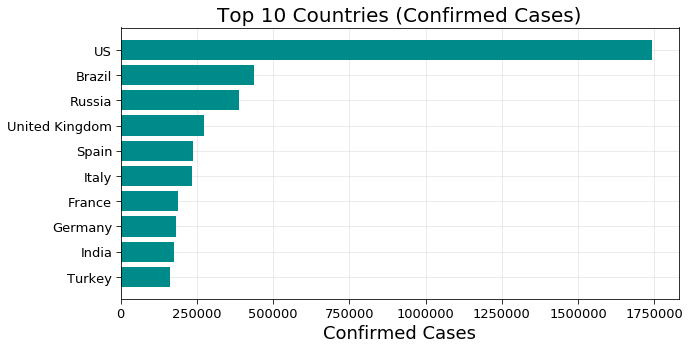

In [11]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-10:],df_countries_cases.sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 Countries (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
plt.savefig('Figures/WW/Top10Countries(ConfirmedCases).png')

* Mortos

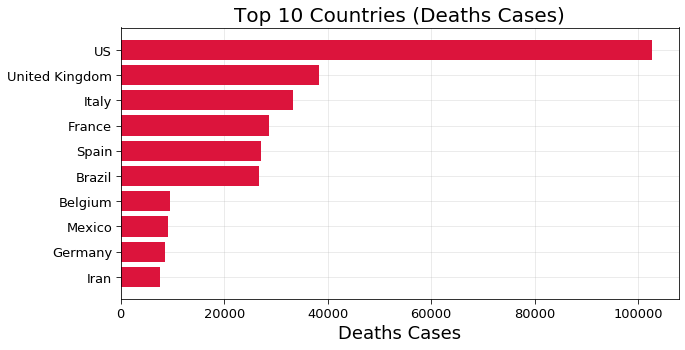

In [12]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Deaths')["Deaths"].index[-10:],df_countries_cases.sort_values('Deaths')["Deaths"].values[-10:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths Cases",fontsize=18)
plt.title("Top 10 Countries (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig('Figures/WW/Top10Countries(DeathsCases).png')

* Ativos

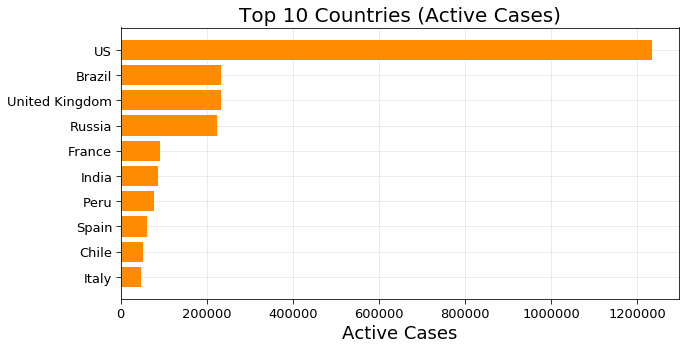

In [13]:

f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Active')["Active"].index[-10:],df_countries_cases.sort_values('Active')["Active"].values[-10:],color="darkorange")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Active Cases",fontsize=18)
plt.title("Top 10 Countries (Active Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig('Figures/WW/Top10Countries(ActiveCases).png')

* Recuperados

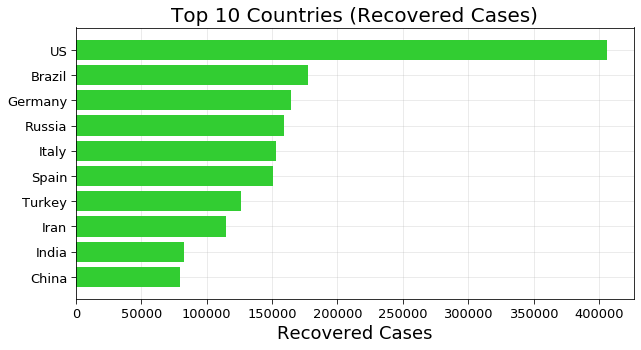

In [14]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Recovered')["Recovered"].index[-10:],df_countries_cases.sort_values('Recovered')["Recovered"].values[-10:],color="limegreen")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Recovered Cases",fontsize=18)
plt.title("Top 10 Countries (Recovered Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
plt.savefig('Figures/WW/Top10Countries(RecoveredCases).png')

### Avanço da propagação

In [15]:
df_data = df_table.groupby(['Last_Update', 'Country_Region'])['Confirmed', 'Deaths'].max().reset_index()
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(df_data, locations="Country_Region", locationmode='country names', 
                     color=np.power(df_data["Confirmed"],0.3)-2 , size= np.power(df_data["Confirmed"]+1,0.3)-1, hover_name="Country_Region",
                     hover_data=["Confirmed"],
                     range_color= [0, max(np.power(df_data["Confirmed"],0.3))], 
                     projection="natural earth", animation_frame="Last_Update", 
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title='COVID-19: Progression of spread'
                    )
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.show()

C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


## Gráficos casos por data

In [16]:
last_time = dict(file.getheaders())["Date"]
print("Last time modified: " + last_time)

Last time modified: Fri, 29 May 2020 22:20:57 GMT


In [17]:
dict(file.getheaders())

{'Connection': 'close',
 'Content-Length': '120126',
 'Cache-Control': 'max-age=300',
 'Content-Security-Policy': "default-src 'none'; style-src 'unsafe-inline'; sandbox",
 'Content-Type': 'text/plain; charset=utf-8',
 'ETag': 'W/"81cb90bd910eb0def98ae3088b7fd803c0445a1daa1f3e8eced7719dc8fd0bd4"',
 'Strict-Transport-Security': 'max-age=31536000',
 'X-Content-Type-Options': 'nosniff',
 'X-Frame-Options': 'deny',
 'X-XSS-Protection': '1; mode=block',
 'Via': '1.1 varnish',
 'X-GitHub-Request-Id': '7F0C:11E8:C9D63:ECC70:5ED18AC8',
 'Accept-Ranges': 'bytes',
 'Date': 'Fri, 29 May 2020 22:20:57 GMT',
 'X-Served-By': 'cache-mad22035-MAD',
 'X-Cache': 'HIT, MISS',
 'X-Cache-Hits': '16, 0',
 'X-Timer': 'S1590790857.054536,VS0,VE118',
 'Vary': 'Authorization,Accept-Encoding',
 'Access-Control-Allow-Origin': '*',
 'X-Fastly-Request-ID': '273a34fb18c2b4d48fb3bab7ecb24598bb6e8b1c',
 'Expires': 'Fri, 29 May 2020 22:25:57 GMT',
 'Source-Age': '173'}

In [18]:
grouped_data = dataCOV.groupby(["Country/Region"])

In [19]:
country_data = grouped_data.sum()

In [20]:
country_sum_data = country_data.drop(["Lat","Long"],axis =1).T
country_df = country_sum_data

In [21]:
fig = go.Figure()
for col in country_df.columns:
    fig.add_trace(go.Scatter(
        x = country_df.index,
        y = country_df[col],
        name = col,
        opacity=0.8)) 
fig.update_layout(title = "Wordwilde Cases",yaxis_type="log")

fig.show() 

In [22]:
large_country = country_df.T.loc[country_df.T["5/27/20"]>100000].T
large_country
large_country_diff = large_country.iloc[:,:].diff()
fig = go.Figure()
for col in large_country.columns:
    fig.add_trace(go.Scatter(
        x = large_country.index,
        y = large_country[col],
        name = col,
        opacity=0.8)) 
fig.update_layout(title = "Worldwide Cases with more than 100000 cases",yaxis_type="log")
fig.show()

In [23]:
df_no_china = country_df.drop("China",axis =1)
fig = go.Figure()
for col in df_no_china.columns:
    fig.add_trace(go.Scatter(
        x = df_no_china.index,
        y = df_no_china[col],
        name = col,
        opacity=0.8)) 
fig.update_layout(title = "Worldwide Cases Without China", yaxis_type="log")
fig.show() 

In [24]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df["China"].values,
    name = "China",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df["US"].values,
    name = "United States",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df["Italy"].values,
    name = "Italy",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df["United Kingdom"].values,
    name = "United Kingdom",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df["Portugal"].values,
    name = "Portugal",
    opacity=0.8)) 

fig.update_layout(title = "Selected Countries",yaxis_type="log")
fig.show() 

In [25]:
country_df_diff = country_df.iloc[:,:].diff()

fig = go.Figure()
for col in country_df_diff.columns:
    fig.add_trace(go.Scatter(
        x = country_df_diff.index,
        y = country_df_diff[col],
        name = col,
        opacity=0.8)) 
fig.update_layout(title = "Worldwide Cases (Daily New Cases)", yaxis_type="log")
fig.show() 

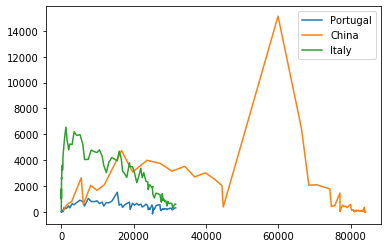

In [26]:
plt.plot(country_df["Portugal"],country_df_diff["Portugal"])
plt.plot(country_df["China"],country_df_diff["China"])
plt.plot(country_df["Portugal"],country_df_diff["Italy"])
plt.legend(['Portugal','China','Italy'])
plt.savefig('Figures/WW/3Countries.png')

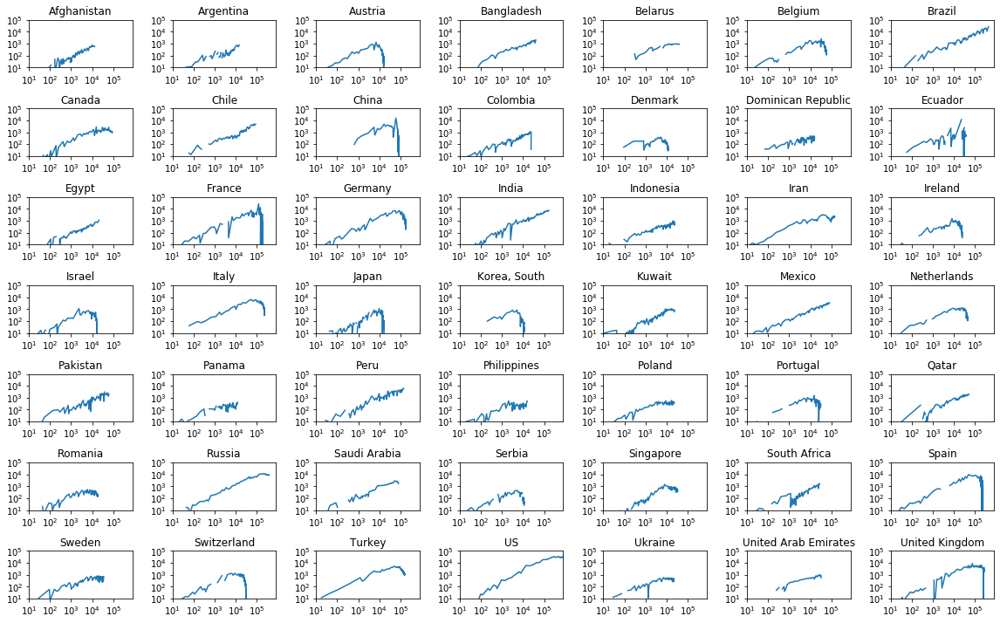

In [27]:
large_country = country_df.T.loc[country_df.T["5/27/20"]>10000].T
large_country[large_country.diff()== 0] = np.NaN
figure, ax = plt.subplots(nrows=7,ncols=7,figsize=(16,10))
m, n = 0,0
for col in large_country.columns:
    ax[m,n].plot(large_country[col],large_country.diff()[col])
    ax[m,n].set_title(col)
    ax[m,n].set_xlim(10,800000)
    ax[m,n].set_ylim(10,100000)
    ax[m,n].set_xscale("symlog")
    ax[m,n].set_yscale("symlog")
    n=n+1
    if n > 6:
        n = 0
        m=m+1
        
plt.tight_layout(True)
plt.savefig('Figures/WW/WW10000.png')

### Curve Fitting Casos Globais de COVID-19

In [28]:
def logistic(t, a, b, c, d):
    return c + (d - c)/(1 + a * np.exp(- b * t))

def exponential(t, a, b, c):
    return a * np.exp(b * t) + c

def plotCases(dataframe, column, country):
    
    co = dataframe[dataframe[column] == country].iloc[:,4:].T.sum(axis = 1)
    co = pd.DataFrame(co)
    co.columns = ['Cases']
    co = co.loc[co['Cases'] > 0]
    
    y = np.array(co['Cases'])
    x = np.arange(y.size)
    
    recentdbltime = float('NaN')
    
    if len(y) >= 7:
        
        current = y[-1]
        lastweek = y[-8]
        
        if current > lastweek:
            print('\n** Based on Most Recent Week of Data **\n')
            print('\tConfirmed cases on',co.index[-1],'\t',current)
            print('\tConfirmed cases on',co.index[-8],'\t',lastweek)
            ratio = current/lastweek
            print('\tRatio:',round(ratio,2))
            print('\tWeekly increase:',round( 100 * (ratio - 1), 1),'%')
            dailypercentchange = round( 100 * (pow(ratio, 1/7) - 1), 1)
            print('\tDaily increase:', dailypercentchange, '% per day')
            recentdbltime = round( 7 * np.log(2) / np.log(ratio), 1)
            print('\tDoubling Time (represents recent growth):',recentdbltime,'days')

    plt.figure(figsize=(10,5))
    plt.plot(x, y, 'ko', label="Original Data")
    
    logisticworked = False
    exponentialworked = False
    
    try:
        lpopt, lpcov = curve_fit(logistic, x, y, maxfev=10000)
        lerror = np.sqrt(np.diag(lpcov))
        
        # for logistic curve at half maximum, slope = growth rate/2. so doubling time = ln(2) / (growth rate/2)
        ldoubletime = np.log(2)/(lpopt[1]/2)
        # standard error
        ldoubletimeerror = 1.96 * ldoubletime * np.abs(lerror[1]/lpopt[1])
        
        # calculate R^2
        residuals = y - logistic(x, *lpopt)
        ss_res = np.sum(residuals**2)
        ss_tot = np.sum((y - np.mean(y))**2)
        logisticr2 = 1 - (ss_res / ss_tot)  
        
        if logisticr2 > 0.95:
            plt.plot(x, logistic(x, *lpopt), 'b--', label="Logistic Curve Fit")
            print('\n** Based on Logistic Fit**\n')
            print('\tR^2:', logisticr2)
            print('\tDoubling Time (during middle of growth): ', round(ldoubletime,2), '(±', round(ldoubletimeerror,2),') days')
            logisticworked = True
    
    except:
        pass
    
    try:
        epopt, epcov = curve_fit(exponential, x, y, bounds=([0,0,-100],[100,0.9,100]), maxfev=10000)
        eerror = np.sqrt(np.diag(epcov))
        
        # for exponential curve, slope = growth rate. so doubling time = ln(2) / growth rate
        edoubletime = np.log(2)/epopt[1]
        # standard error
        edoubletimeerror = 1.96 * edoubletime * np.abs(eerror[1]/epopt[1])
        
        # calculate R^2
        residuals = y - exponential(x, *epopt)
        ss_res = np.sum(residuals**2)
        ss_tot = np.sum((y - np.mean(y))**2)
        expr2 = 1 - (ss_res / ss_tot)
        
        if expr2 > 0.95:
            plt.plot(x, exponential(x, *epopt), 'r--', label="Exponential Curve Fit")
            print('\n** Based on Exponential Fit **\n')
            print('\tR^2:', expr2)
            print('\tDoubling Time (represents overall growth): ', round(edoubletime,2), '(±', round(edoubletimeerror,2),') days')
            exponentialworked = True
            
    except:
        pass
    
    plt.title(country + ' Cumulative COVID-19 Cases. (Updated on '+mostrecentdate+')', fontsize="x-large")
    plt.xlabel('Days', fontsize="x-large")
    plt.ylabel('Total Cases', fontsize="x-large")
    plt.legend(fontsize="x-large")
    
    plt.savefig("Figures/WW/CurveFitting_"+str(country)+".png")
    
    plt.show()
    
    
    if logisticworked and exponentialworked:
        if round(logisticr2,2) > round(expr2,2):
            return [ldoubletime, ldoubletimeerror, recentdbltime]
        else:
            return [edoubletime, edoubletimeerror, recentdbltime]
            
    if logisticworked:
        return [ldoubletime, ldoubletimeerror, recentdbltime]
    
    if exponentialworked:
        return [edoubletime, edoubletimeerror, recentdbltime]
    
    else:
        return [float('NaN'), float('NaN'), recentdbltime]



US

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1721753.0
	Confirmed cases on 5/21/20 	 1577147.0
	Ratio: 1.09
	Weekly increase: 9.2 %
	Daily increase: 1.3 % per day
	Doubling Time (represents recent growth): 55.3 days

** Based on Logistic Fit**

	R^2: 0.9961094426207232
	Doubling Time (during middle of growth):  17.66 (± 0.92 ) days


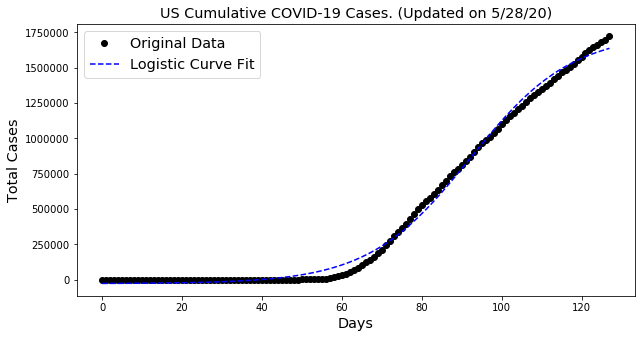



Brazil

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 438238.0
	Confirmed cases on 5/21/20 	 310087.0
	Ratio: 1.41
	Weekly increase: 41.3 %
	Daily increase: 5.1 % per day
	Doubling Time (represents recent growth): 14.0 days

** Based on Logistic Fit**

	R^2: 0.99962798552391
	Doubling Time (during middle of growth):  19.36 (± 0.51 ) days


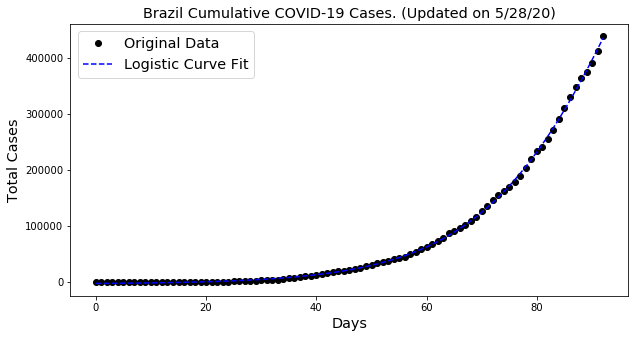



Russia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 379051.0
	Confirmed cases on 5/21/20 	 317554.0
	Ratio: 1.19
	Weekly increase: 19.4 %
	Daily increase: 2.6 % per day
	Doubling Time (represents recent growth): 27.4 days

** Based on Logistic Fit**

	R^2: 0.9995423315455041
	Doubling Time (during middle of growth):  13.52 (± 0.26 ) days


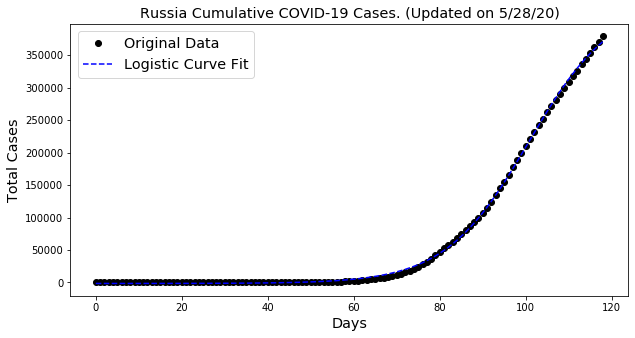



United Kingdom

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 270508.0
	Confirmed cases on 5/21/20 	 252246.0
	Ratio: 1.07
	Weekly increase: 7.2 %
	Daily increase: 1.0 % per day
	Doubling Time (represents recent growth): 69.4 days

** Based on Logistic Fit**

	R^2: 0.9977397859726254
	Doubling Time (during middle of growth):  16.42 (± 0.67 ) days


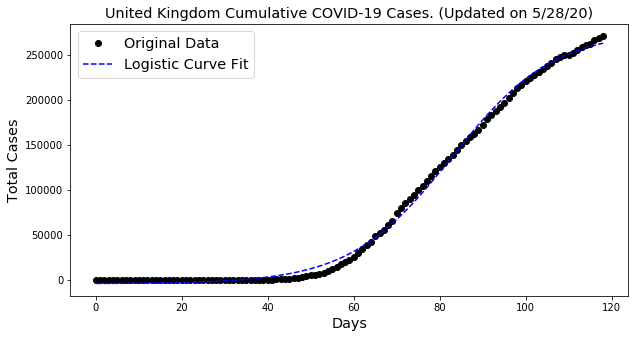



Spain

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 237906.0
	Confirmed cases on 5/21/20 	 233037.0
	Ratio: 1.02
	Weekly increase: 2.1 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 234.6 days

** Based on Logistic Fit**

	R^2: 0.9973189223915856
	Doubling Time (during middle of growth):  10.95 (± 0.49 ) days


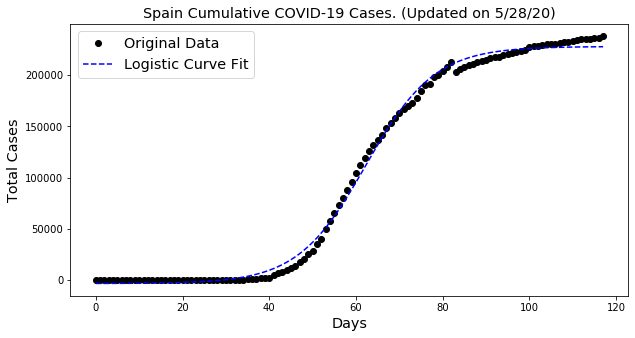



Italy

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 231732.0
	Confirmed cases on 5/21/20 	 228006.0
	Ratio: 1.02
	Weekly increase: 1.6 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 299.3 days

** Based on Logistic Fit**

	R^2: 0.9972703025433944
	Doubling Time (during middle of growth):  15.59 (± 0.67 ) days


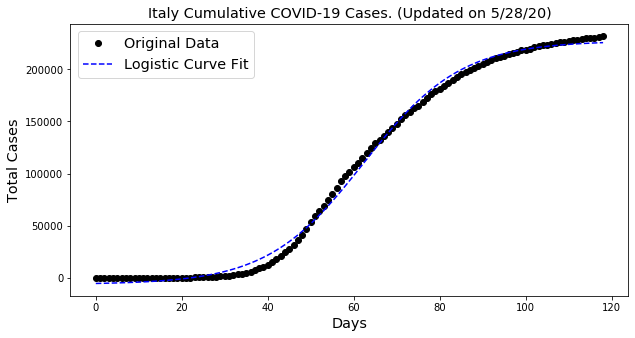



France

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 186364.0
	Confirmed cases on 5/21/20 	 181951.0
	Ratio: 1.02
	Weekly increase: 2.4 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 202.5 days

** Based on Logistic Fit**

	R^2: 0.9980850709892127
	Doubling Time (during middle of growth):  10.5 (± 0.39 ) days


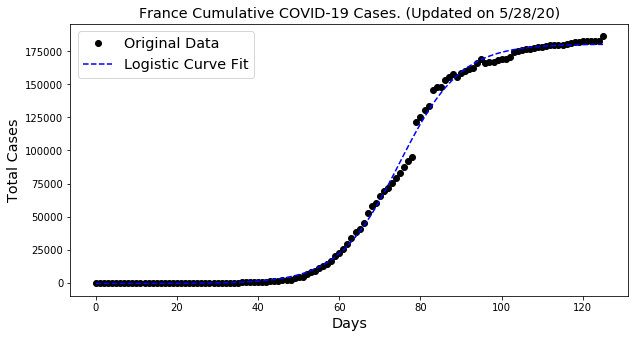



Germany

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 182196.0
	Confirmed cases on 5/21/20 	 179021.0
	Ratio: 1.02
	Weekly increase: 1.8 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 276.0 days

** Based on Logistic Fit**

	R^2: 0.9970108850944207
	Doubling Time (during middle of growth):  11.53 (± 0.53 ) days


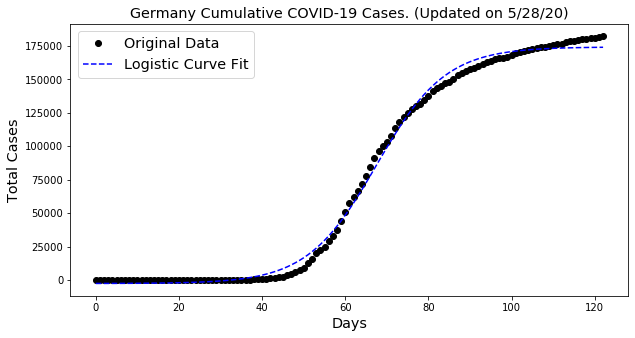



India

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 165386.0
	Confirmed cases on 5/21/20 	 118226.0
	Ratio: 1.4
	Weekly increase: 39.9 %
	Daily increase: 4.9 % per day
	Doubling Time (represents recent growth): 14.5 days

** Based on Logistic Fit**

	R^2: 0.9993363898971833
	Doubling Time (during middle of growth):  19.66 (± 0.55 ) days

** Based on Exponential Fit **

	R^2: 0.991792197570099
	Doubling Time (represents overall growth):  11.0 (± 0.39 ) days


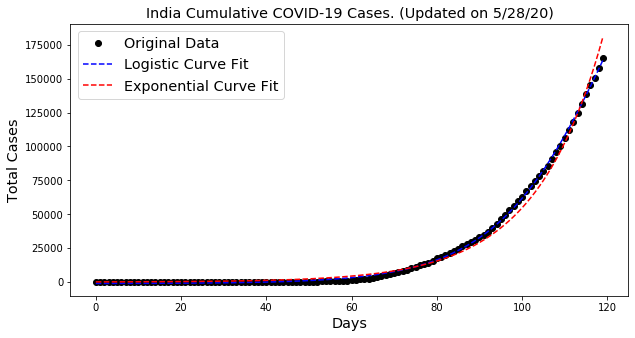



Turkey

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 160979.0
	Confirmed cases on 5/21/20 	 153548.0
	Ratio: 1.05
	Weekly increase: 4.8 %
	Daily increase: 0.7 % per day
	Doubling Time (represents recent growth): 102.7 days

** Based on Logistic Fit**

	R^2: 0.9973063728524095
	Doubling Time (during middle of growth):  13.84 (± 0.78 ) days


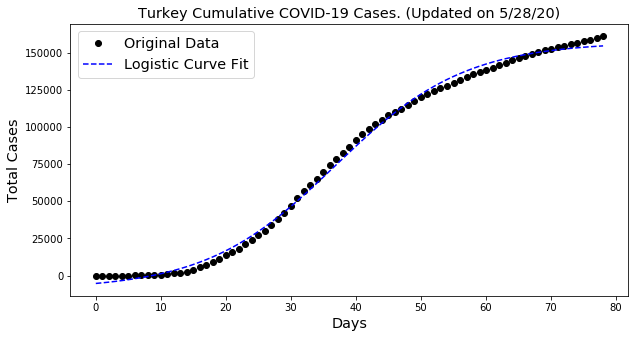



Iran

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 143849.0
	Confirmed cases on 5/21/20 	 129341.0
	Ratio: 1.11
	Weekly increase: 11.2 %
	Daily increase: 1.5 % per day
	Doubling Time (represents recent growth): 45.6 days

** Based on Logistic Fit**

	R^2: 0.9900504251488144
	Doubling Time (during middle of growth):  32.88 (± 5.37 ) days


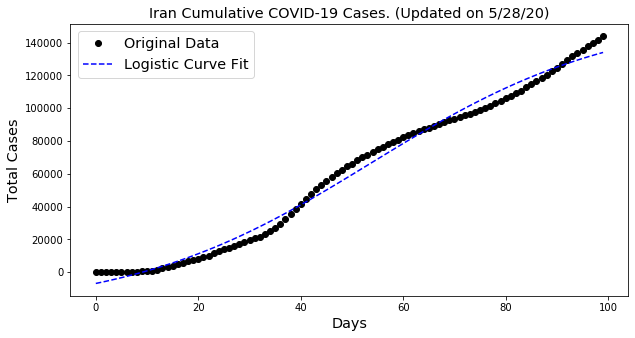



Peru

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 141779.0
	Confirmed cases on 5/21/20 	 108769.0
	Ratio: 1.3
	Weekly increase: 30.3 %
	Daily increase: 3.9 % per day
	Doubling Time (represents recent growth): 18.3 days

** Based on Logistic Fit**

	R^2: 0.998839001165372
	Doubling Time (during middle of growth):  17.84 (± 0.81 ) days


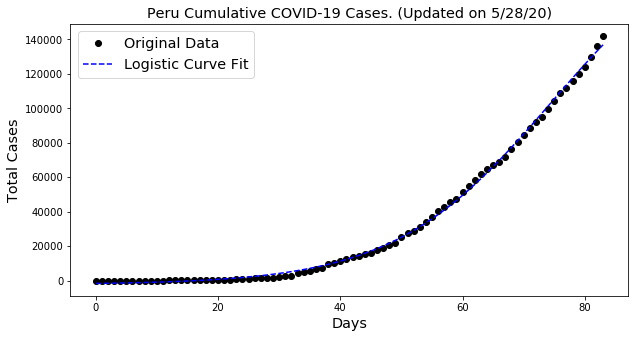



Canada

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 89976.0
	Confirmed cases on 5/21/20 	 82742.0
	Ratio: 1.09
	Weekly increase: 8.7 %
	Daily increase: 1.2 % per day
	Doubling Time (represents recent growth): 57.9 days

** Based on Logistic Fit**

	R^2: 0.9981638663154062
	Doubling Time (during middle of growth):  17.03 (± 0.62 ) days


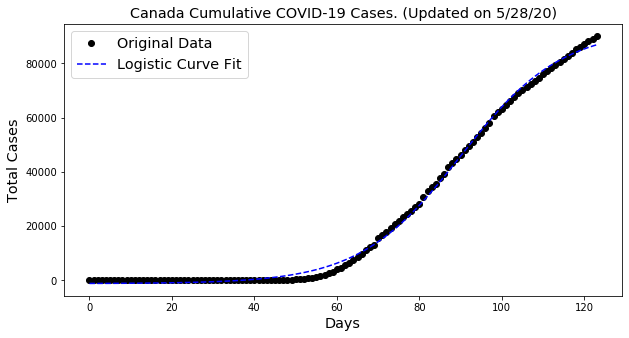



Chile

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 86943.0
	Confirmed cases on 5/21/20 	 57581.0
	Ratio: 1.51
	Weekly increase: 51.0 %
	Daily increase: 6.1 % per day
	Doubling Time (represents recent growth): 11.8 days

** Based on Logistic Fit**

	R^2: 0.9980740766588243
	Doubling Time (during middle of growth):  23.38 (± inf ) days

** Based on Exponential Fit **

	R^2: 0.9652116587246288
	Doubling Time (represents overall growth):  8.66 (± 0.72 ) days


C:\OSGEO4~1\apps\Python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning:

Covariance of the parameters could not be estimated



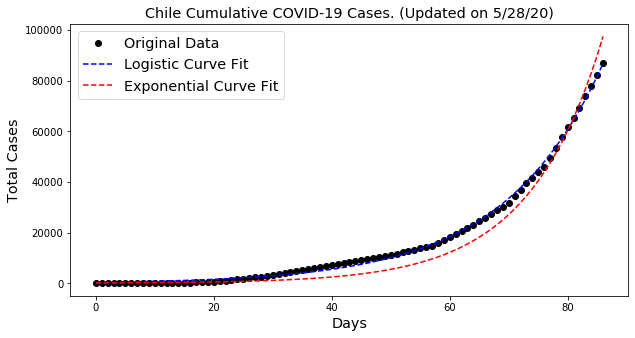



China

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 84106.0
	Confirmed cases on 5/21/20 	 84063.0
	Ratio: 1.0
	Weekly increase: 0.1 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 9487.9 days

** Based on Logistic Fit**

	R^2: 0.9950392701575236
	Doubling Time (during middle of growth):  7.0 (± 0.42 ) days


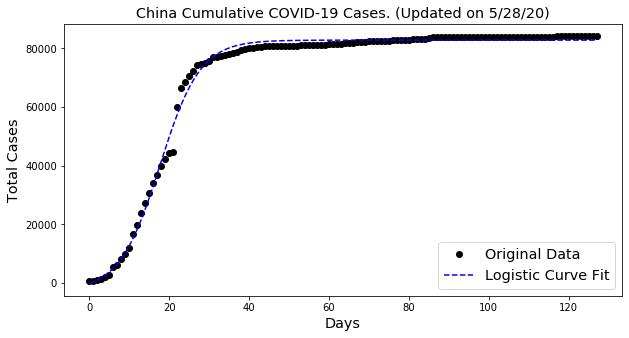



Mexico

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 81400.0
	Confirmed cases on 5/21/20 	 59567.0
	Ratio: 1.37
	Weekly increase: 36.7 %
	Daily increase: 4.6 % per day
	Doubling Time (represents recent growth): 15.5 days

** Based on Logistic Fit**

	R^2: 0.9994537993843792
	Doubling Time (during middle of growth):  19.62 (± 0.62 ) days


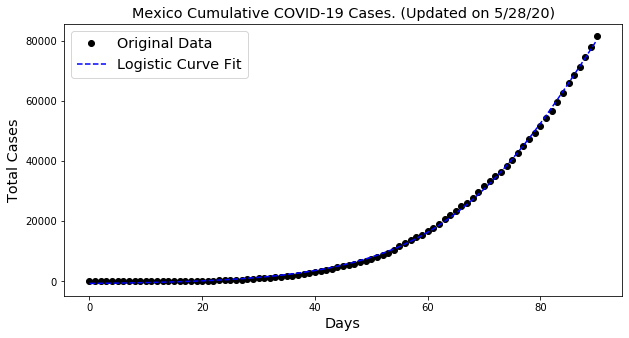



Saudi Arabia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 80185.0
	Confirmed cases on 5/21/20 	 65077.0
	Ratio: 1.23
	Weekly increase: 23.2 %
	Daily increase: 3.0 % per day
	Doubling Time (represents recent growth): 23.2 days

** Based on Logistic Fit**

	R^2: 0.9992067701133988
	Doubling Time (during middle of growth):  17.75 (± 0.63 ) days


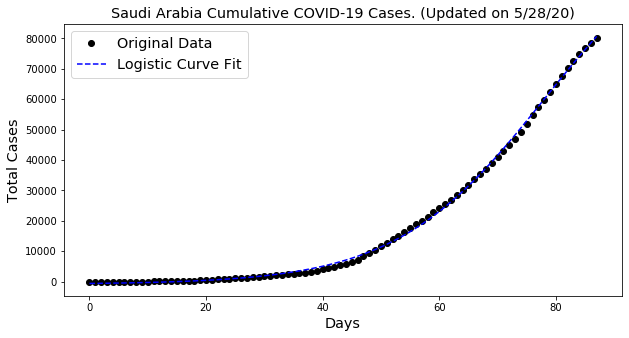



Pakistan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 61227.0
	Confirmed cases on 5/21/20 	 48091.0
	Ratio: 1.27
	Weekly increase: 27.3 %
	Daily increase: 3.5 % per day
	Doubling Time (represents recent growth): 20.1 days

** Based on Logistic Fit**

	R^2: 0.9994839205608979
	Doubling Time (during middle of growth):  19.74 (± 0.58 ) days


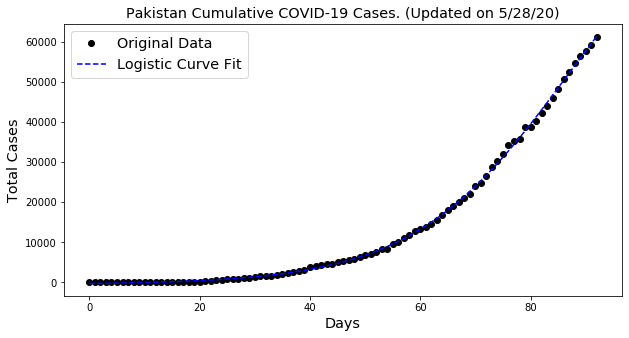



Belgium

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 57849.0
	Confirmed cases on 5/21/20 	 56235.0
	Ratio: 1.03
	Weekly increase: 2.9 %
	Daily increase: 0.4 % per day
	Doubling Time (represents recent growth): 171.5 days

** Based on Logistic Fit**

	R^2: 0.9983578545792426
	Doubling Time (during middle of growth):  13.02 (± 0.44 ) days


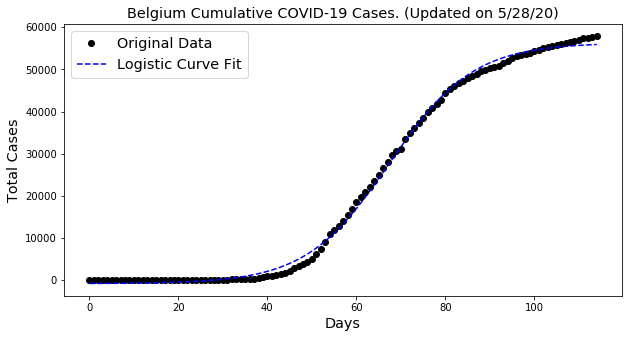



Qatar

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 50914.0
	Confirmed cases on 5/21/20 	 38651.0
	Ratio: 1.32
	Weekly increase: 31.7 %
	Daily increase: 4.0 % per day
	Doubling Time (represents recent growth): 17.6 days

** Based on Logistic Fit**

	R^2: 0.9993281275028991
	Doubling Time (during middle of growth):  18.94 (± 0.65 ) days


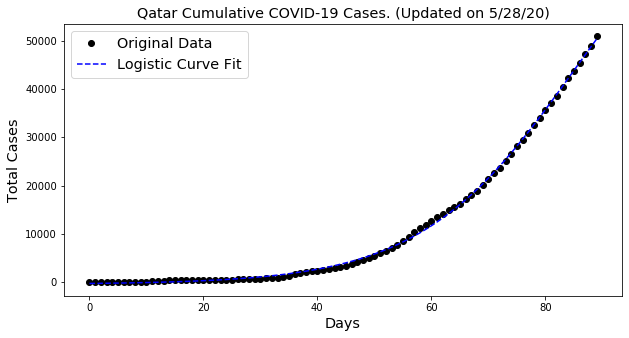



Netherlands

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 46152.0
	Confirmed cases on 5/21/20 	 44900.0
	Ratio: 1.03
	Weekly increase: 2.8 %
	Daily increase: 0.4 % per day
	Doubling Time (represents recent growth): 176.4 days

** Based on Logistic Fit**

	R^2: 0.9989669554332378
	Doubling Time (during middle of growth):  14.14 (± 0.44 ) days


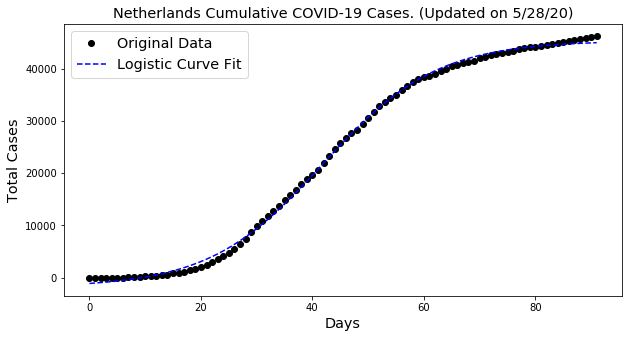



Bangladesh

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 40321.0
	Confirmed cases on 5/21/20 	 28511.0
	Ratio: 1.41
	Weekly increase: 41.4 %
	Daily increase: 5.1 % per day
	Doubling Time (represents recent growth): 14.0 days

** Based on Logistic Fit**

	R^2: 0.9986519938441804
	Doubling Time (during middle of growth):  17.66 (± 0.93 ) days

** Based on Exponential Fit **

	R^2: 0.9776519485063908
	Doubling Time (represents overall growth):  9.16 (± 0.67 ) days


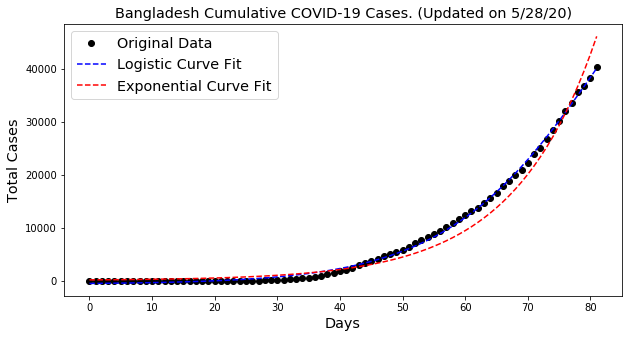



Belarus

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 39858.0
	Confirmed cases on 5/21/20 	 33371.0
	Ratio: 1.19
	Weekly increase: 19.4 %
	Daily increase: 2.6 % per day
	Doubling Time (represents recent growth): 27.3 days

** Based on Logistic Fit**

	R^2: 0.998453291232281
	Doubling Time (during middle of growth):  15.27 (± 0.65 ) days


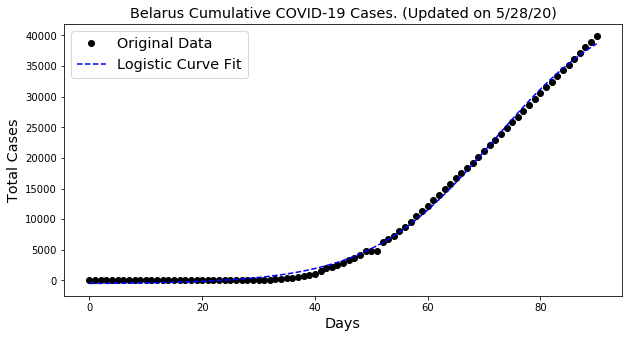



Ecuador

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 38471.0
	Confirmed cases on 5/21/20 	 35306.0
	Ratio: 1.09
	Weekly increase: 9.0 %
	Daily increase: 1.2 % per day
	Doubling Time (represents recent growth): 56.5 days

** Based on Logistic Fit**

	R^2: 0.9841426348815625
	Doubling Time (during middle of growth):  10.56 (± 1.29 ) days


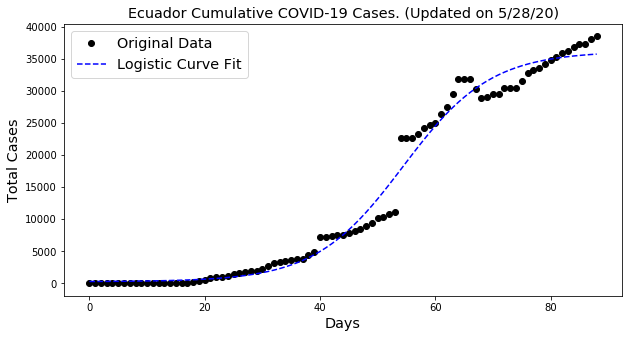



Sweden

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 35727.0
	Confirmed cases on 5/21/20 	 32172.0
	Ratio: 1.11
	Weekly increase: 11.0 %
	Daily increase: 1.5 % per day
	Doubling Time (represents recent growth): 46.3 days

** Based on Logistic Fit**

	R^2: 0.9982117837207111
	Doubling Time (during middle of growth):  21.03 (± 0.83 ) days


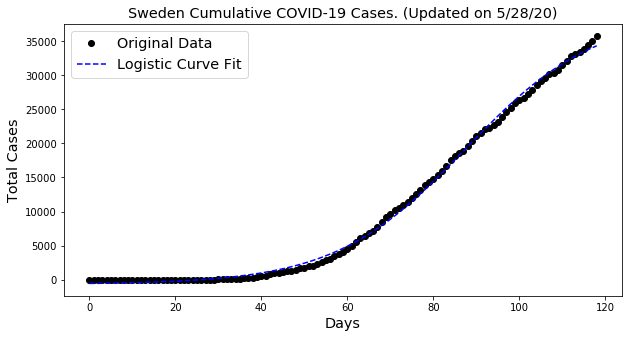



Singapore

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 33249.0
	Confirmed cases on 5/21/20 	 29812.0
	Ratio: 1.12
	Weekly increase: 11.5 %
	Daily increase: 1.6 % per day
	Doubling Time (represents recent growth): 44.5 days

** Based on Logistic Fit**

	R^2: 0.9970525909224238
	Doubling Time (during middle of growth):  13.19 (± 0.6 ) days


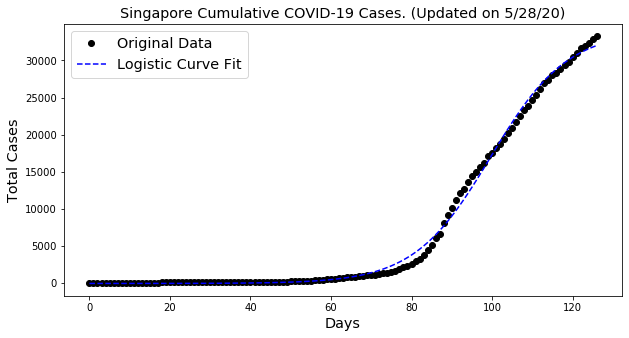



United Arab Emirates

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 32532.0
	Confirmed cases on 5/21/20 	 26898.0
	Ratio: 1.21
	Weekly increase: 20.9 %
	Daily increase: 2.8 % per day
	Doubling Time (represents recent growth): 25.5 days

** Based on Logistic Fit**

	R^2: 0.9973429412839205
	Doubling Time (during middle of growth):  20.47 (± 1.05 ) days

** Based on Exponential Fit **

	R^2: 0.9726077899025741
	Doubling Time (represents overall growth):  14.0 (± 0.96 ) days


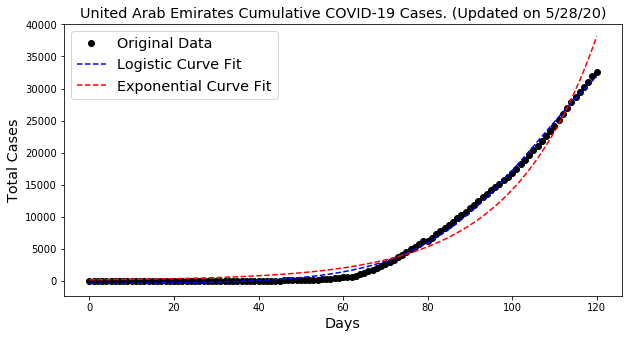



Portugal

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 31596.0
	Confirmed cases on 5/21/20 	 29912.0
	Ratio: 1.06
	Weekly increase: 5.6 %
	Daily increase: 0.8 % per day
	Doubling Time (represents recent growth): 88.6 days

** Based on Logistic Fit**

	R^2: 0.9953984206290467
	Doubling Time (during middle of growth):  15.77 (± 1.12 ) days


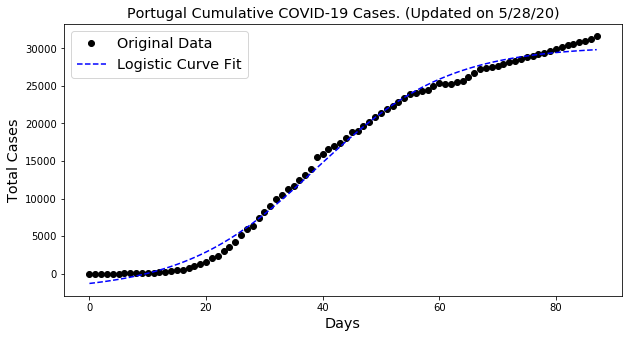



Switzerland

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 30796.0
	Confirmed cases on 5/21/20 	 30694.0
	Ratio: 1.0
	Weekly increase: 0.3 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 1462.5 days

** Based on Logistic Fit**

	R^2: 0.9978911702856489
	Doubling Time (during middle of growth):  10.57 (± 0.46 ) days


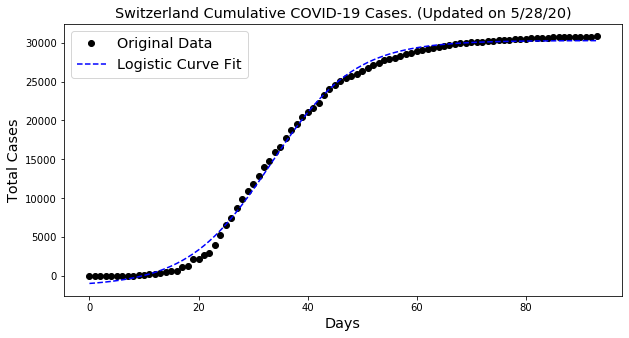



South Africa

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 27403.0
	Confirmed cases on 5/21/20 	 19137.0
	Ratio: 1.43
	Weekly increase: 43.2 %
	Daily increase: 5.3 % per day
	Doubling Time (represents recent growth): 13.5 days

** Based on Logistic Fit**

	R^2: 0.998899304748768
	Doubling Time (during middle of growth):  24.8 (± 1.56 ) days

** Based on Exponential Fit **

	R^2: 0.9849312979475141
	Doubling Time (represents overall growth):  10.22 (± 0.6 ) days


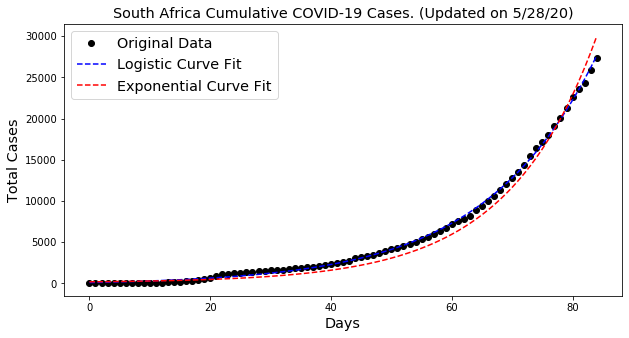



Ireland

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 24841.0
	Confirmed cases on 5/21/20 	 24391.0
	Ratio: 1.02
	Weekly increase: 1.8 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 265.4 days

** Based on Logistic Fit**

	R^2: 0.9990179395140195
	Doubling Time (during middle of growth):  11.6 (± 0.35 ) days


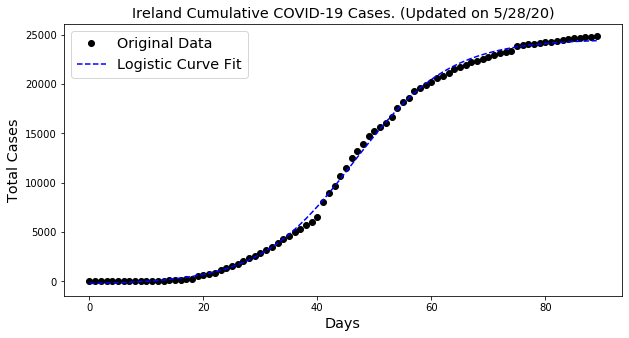



Indonesia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 24538.0
	Confirmed cases on 5/21/20 	 20162.0
	Ratio: 1.22
	Weekly increase: 21.7 %
	Daily increase: 2.8 % per day
	Doubling Time (represents recent growth): 24.7 days

** Based on Logistic Fit**

	R^2: 0.9975705502572941
	Doubling Time (during middle of growth):  31.18 (± 3.16 ) days


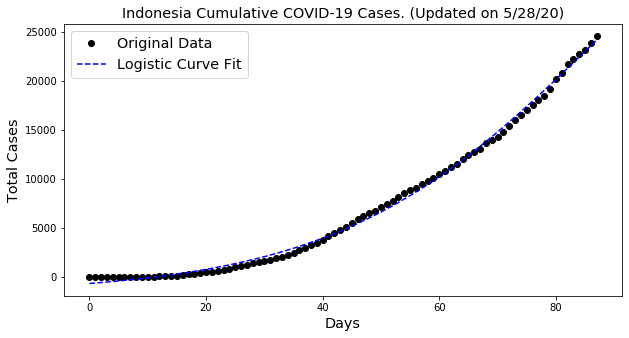



Colombia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 24141.0
	Confirmed cases on 5/21/20 	 18330.0
	Ratio: 1.32
	Weekly increase: 31.7 %
	Daily increase: 4.0 % per day
	Doubling Time (represents recent growth): 17.6 days

** Based on Logistic Fit**

	R^2: 0.9994029117902783
	Doubling Time (during middle of growth):  27.22 (± 1.35 ) days


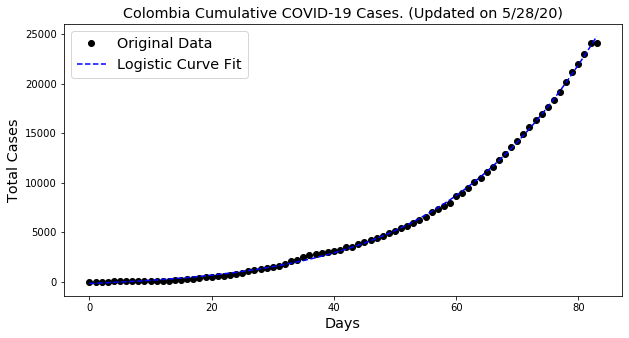



Kuwait

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 24112.0
	Confirmed cases on 5/21/20 	 18609.0
	Ratio: 1.3
	Weekly increase: 29.6 %
	Daily increase: 3.8 % per day
	Doubling Time (represents recent growth): 18.7 days

** Based on Logistic Fit**

	R^2: 0.998651485985685
	Doubling Time (during middle of growth):  13.96 (± 0.58 ) days

** Based on Exponential Fit **

	R^2: 0.9915642342705339
	Doubling Time (represents overall growth):  11.11 (± 0.48 ) days


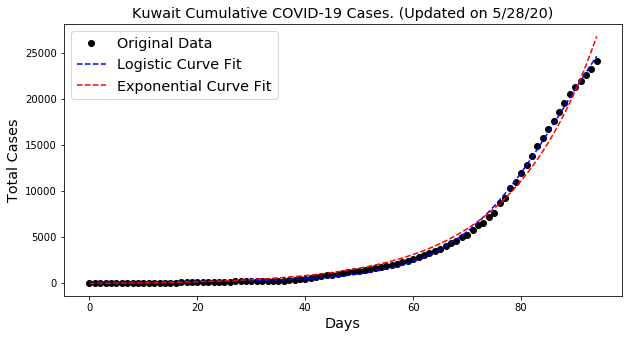



Poland

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 22825.0
	Confirmed cases on 5/21/20 	 20143.0
	Ratio: 1.13
	Weekly increase: 13.3 %
	Daily increase: 1.8 % per day
	Doubling Time (represents recent growth): 38.8 days

** Based on Logistic Fit**

	R^2: 0.9963231589124172
	Doubling Time (during middle of growth):  26.78 (± 2.72 ) days


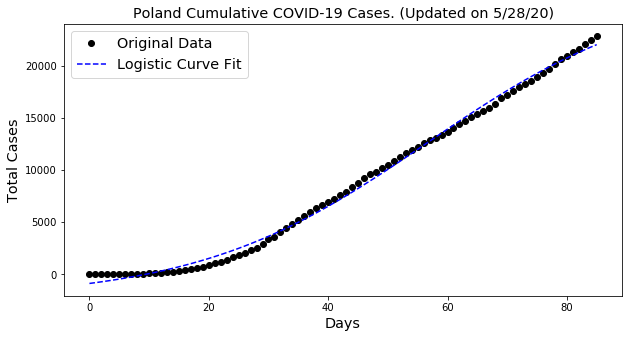



Ukraine

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 22382.0
	Confirmed cases on 5/21/20 	 19706.0
	Ratio: 1.14
	Weekly increase: 13.6 %
	Daily increase: 1.8 % per day
	Doubling Time (represents recent growth): 38.1 days

** Based on Logistic Fit**

	R^2: 0.998821750357336
	Doubling Time (during middle of growth):  16.47 (± 0.64 ) days


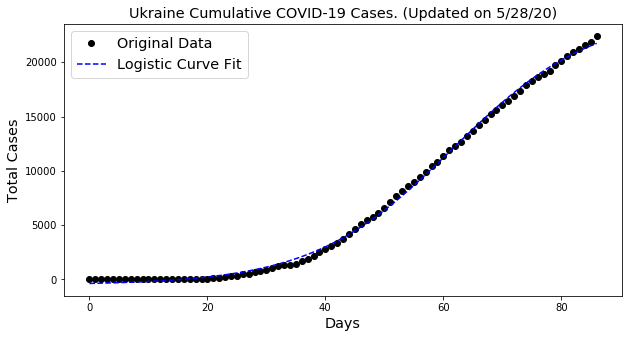



Egypt

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 20793.0
	Confirmed cases on 5/21/20 	 15003.0
	Ratio: 1.39
	Weekly increase: 38.6 %
	Daily increase: 4.8 % per day
	Doubling Time (represents recent growth): 14.9 days

** Based on Logistic Fit**

	R^2: 0.9991519492643635
	Doubling Time (during middle of growth):  26.76 (± 1.15 ) days

** Based on Exponential Fit **

	R^2: 0.9953374487076843
	Doubling Time (represents overall growth):  13.4 (± 0.41 ) days


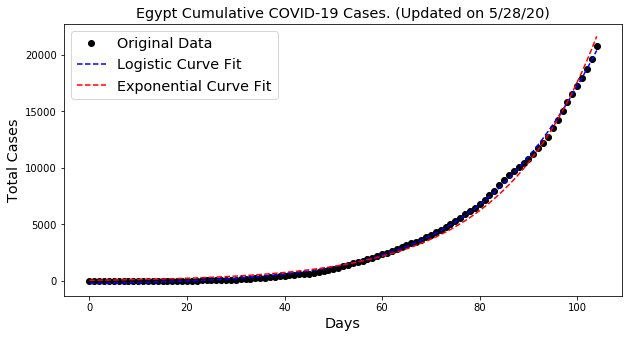



Romania

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 18791.0
	Confirmed cases on 5/21/20 	 17585.0
	Ratio: 1.07
	Weekly increase: 6.9 %
	Daily increase: 1.0 % per day
	Doubling Time (represents recent growth): 73.1 days

** Based on Logistic Fit**

	R^2: 0.997953063688343
	Doubling Time (during middle of growth):  18.34 (± 0.89 ) days


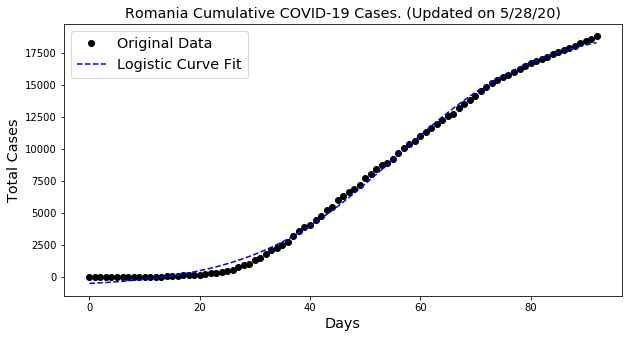



Israel

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 16872.0
	Confirmed cases on 5/21/20 	 16683.0
	Ratio: 1.01
	Weekly increase: 1.1 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 430.7 days

** Based on Logistic Fit**

	R^2: 0.997361627315354
	Doubling Time (during middle of growth):  10.55 (± 0.5 ) days


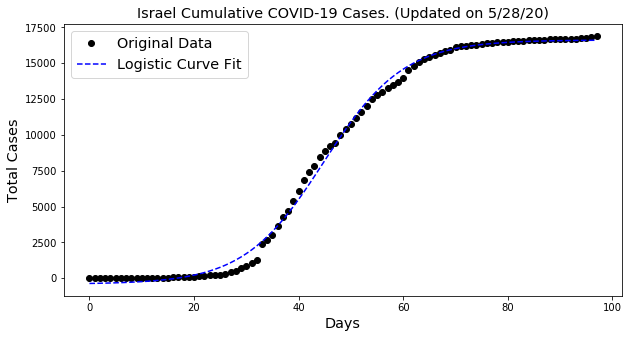



Austria

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 16628.0
	Confirmed cases on 5/21/20 	 16404.0
	Ratio: 1.01
	Weekly increase: 1.4 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 357.7 days

** Based on Logistic Fit**

	R^2: 0.9953393057185879
	Doubling Time (during middle of growth):  8.79 (± 0.58 ) days


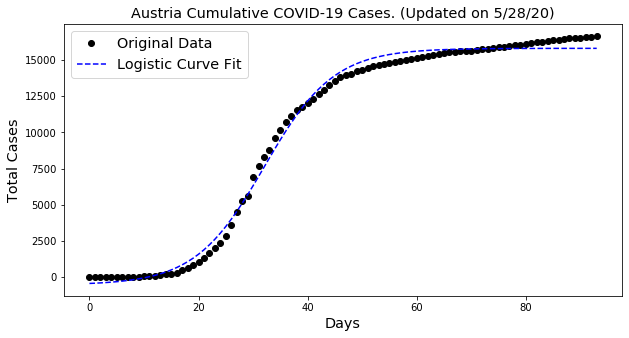



Japan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 16598.0
	Confirmed cases on 5/21/20 	 16424.0
	Ratio: 1.01
	Weekly increase: 1.1 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 460.4 days

** Based on Logistic Fit**

	R^2: 0.9989767058312269
	Doubling Time (during middle of growth):  10.61 (± 0.28 ) days


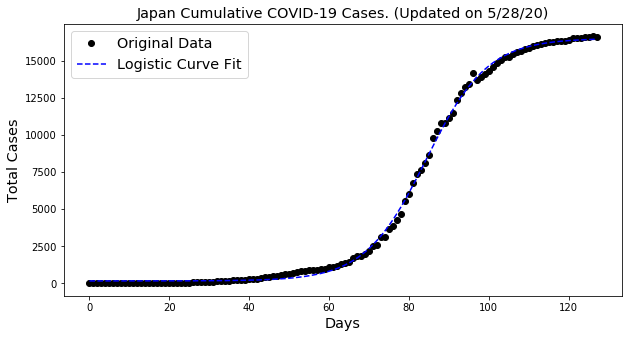



Dominican Republic

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 16068.0
	Confirmed cases on 5/21/20 	 13657.0
	Ratio: 1.18
	Weekly increase: 17.7 %
	Daily increase: 2.3 % per day
	Doubling Time (represents recent growth): 29.8 days

** Based on Logistic Fit**

	R^2: 0.9984260578024352
	Doubling Time (during middle of growth):  24.87 (± 1.5 ) days


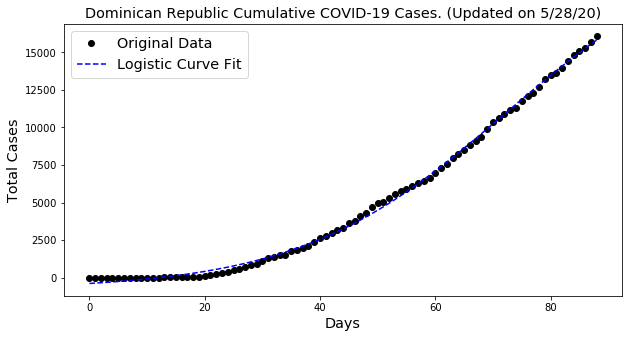



Philippines

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 15588.0
	Confirmed cases on 5/21/20 	 13434.0
	Ratio: 1.16
	Weekly increase: 16.0 %
	Daily increase: 2.1 % per day
	Doubling Time (represents recent growth): 32.6 days

** Based on Logistic Fit**

	R^2: 0.9936787141962612
	Doubling Time (during middle of growth):  22.06 (± 1.67 ) days


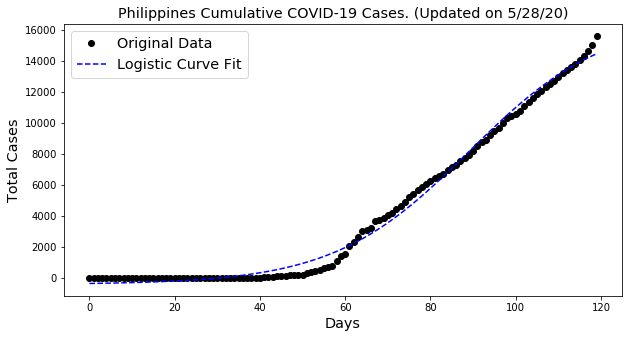



Argentina

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 14702.0
	Confirmed cases on 5/21/20 	 9931.0
	Ratio: 1.48
	Weekly increase: 48.0 %
	Daily increase: 5.8 % per day
	Doubling Time (represents recent growth): 12.4 days

** Based on Logistic Fit**

	R^2: 0.9918630759690551
	Doubling Time (during middle of growth):  34.36 (± inf ) days

** Based on Exponential Fit **

	R^2: 0.9605172354862601
	Doubling Time (represents overall growth):  11.82 (± 1.14 ) days


C:\OSGEO4~1\apps\Python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning:

Covariance of the parameters could not be estimated



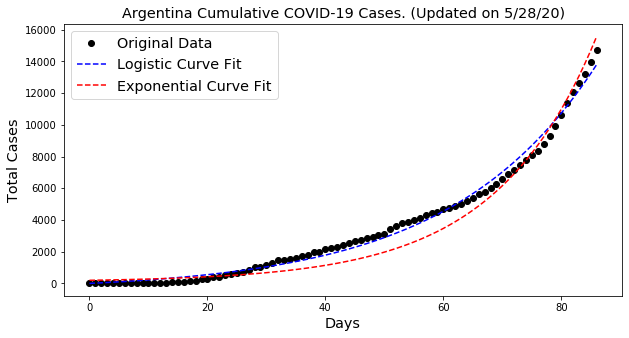



Afghanistan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 13036.0
	Confirmed cases on 5/21/20 	 8676.0
	Ratio: 1.5
	Weekly increase: 50.3 %
	Daily increase: 6.0 % per day
	Doubling Time (represents recent growth): 11.9 days

** Based on Logistic Fit**

	R^2: 0.9997260408113899
	Doubling Time (during middle of growth):  19.48 (± 0.45 ) days

** Based on Exponential Fit **

	R^2: 0.999286809492298
	Doubling Time (represents overall growth):  11.01 (± 0.14 ) days


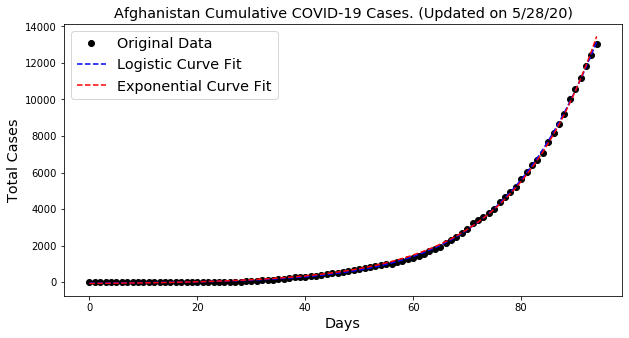



Panama

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 12131.0
	Confirmed cases on 5/21/20 	 10116.0
	Ratio: 1.2
	Weekly increase: 19.9 %
	Daily increase: 2.6 % per day
	Doubling Time (represents recent growth): 26.7 days

** Based on Logistic Fit**

	R^2: 0.9976180323003635
	Doubling Time (during middle of growth):  26.21 (± 2.36 ) days


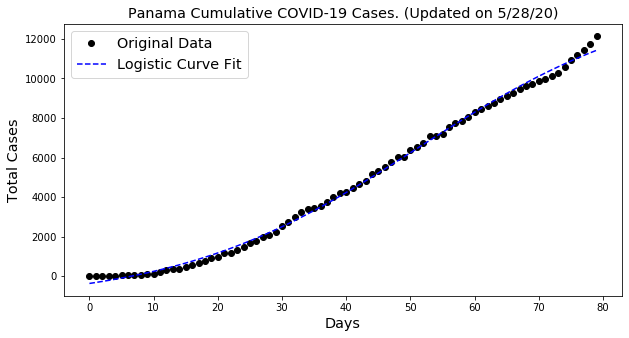



Denmark

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 11712.0
	Confirmed cases on 5/21/20 	 11380.0
	Ratio: 1.03
	Weekly increase: 2.9 %
	Daily increase: 0.4 % per day
	Doubling Time (represents recent growth): 168.7 days

** Based on Logistic Fit**

	R^2: 0.9978787387164569
	Doubling Time (during middle of growth):  18.46 (± 0.92 ) days


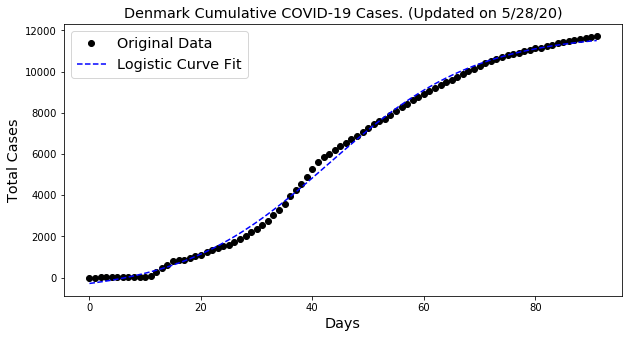



Korea, South

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 11402.0
	Confirmed cases on 5/21/20 	 11142.0
	Ratio: 1.02
	Weekly increase: 2.3 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 210.3 days

** Based on Logistic Fit**

	R^2: 0.9877425580287446
	Doubling Time (during middle of growth):  9.7 (± 0.92 ) days


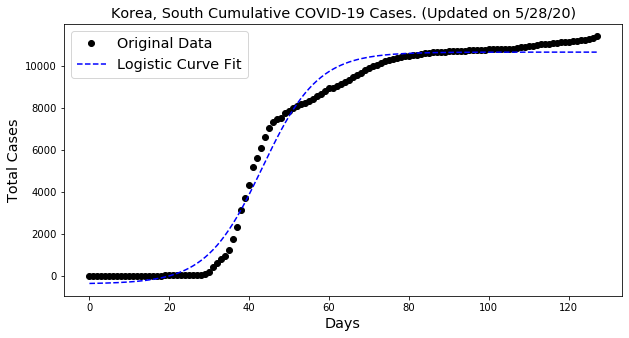



Serbia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 11300.0
	Confirmed cases on 5/21/20 	 10919.0
	Ratio: 1.03
	Weekly increase: 3.5 %
	Daily increase: 0.5 % per day
	Doubling Time (represents recent growth): 141.5 days

** Based on Logistic Fit**

	R^2: 0.9986504776596703
	Doubling Time (during middle of growth):  11.82 (± 0.43 ) days


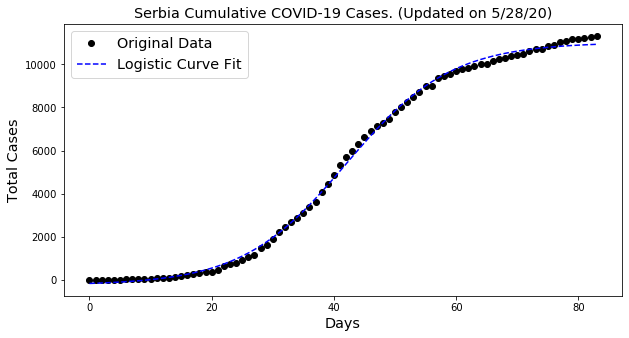



Bahrain

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 10052.0
	Confirmed cases on 5/21/20 	 8174.0
	Ratio: 1.23
	Weekly increase: 23.0 %
	Daily increase: 3.0 % per day
	Doubling Time (represents recent growth): 23.5 days

** Based on Logistic Fit**

	R^2: 0.9983405780307589
	Doubling Time (during middle of growth):  23.52 (± 1.38 ) days

** Based on Exponential Fit **

	R^2: 0.9892908889671582
	Doubling Time (represents overall growth):  13.83 (± 0.72 ) days


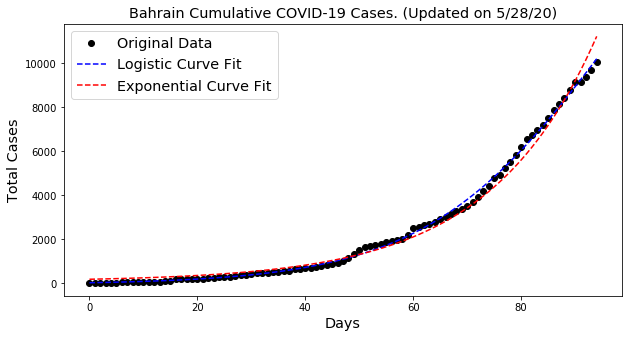



Kazakhstan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 9576.0
	Confirmed cases on 5/21/20 	 7234.0
	Ratio: 1.32
	Weekly increase: 32.4 %
	Daily increase: 4.1 % per day
	Doubling Time (represents recent growth): 17.3 days

** Based on Logistic Fit**

	R^2: 0.9963129026126718
	Doubling Time (during middle of growth):  30.21 (± 4.67 ) days


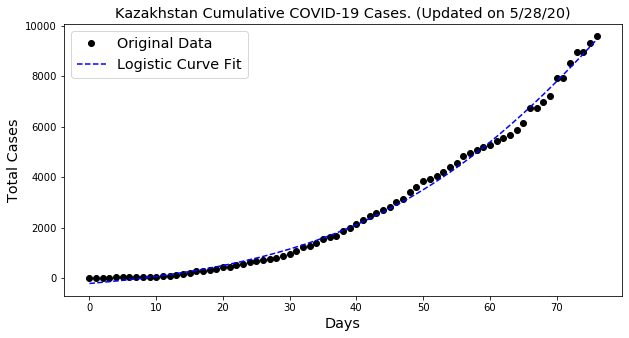



Czechia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 9140.0
	Confirmed cases on 5/21/20 	 8754.0
	Ratio: 1.04
	Weekly increase: 4.4 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 112.4 days

** Based on Logistic Fit**

	R^2: 0.9938656870117545
	Doubling Time (during middle of growth):  14.36 (± 1.14 ) days


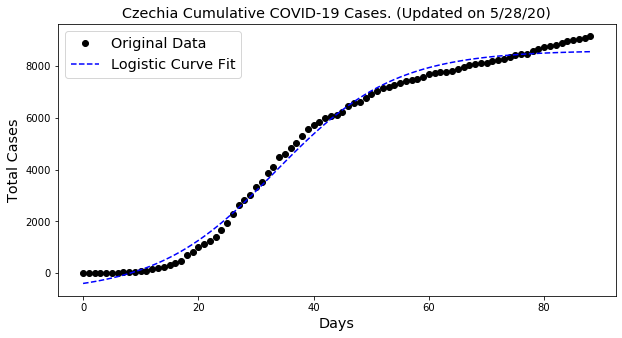



Oman

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 9009.0
	Confirmed cases on 5/21/20 	 6370.0
	Ratio: 1.41
	Weekly increase: 41.4 %
	Daily increase: 5.1 % per day
	Doubling Time (represents recent growth): 14.0 days

** Based on Logistic Fit**

	R^2: 0.9963851917788357
	Doubling Time (during middle of growth):  28.1 (± 3.08 ) days

** Based on Exponential Fit **

	R^2: 0.9958108340377458
	Doubling Time (represents overall growth):  13.57 (± 0.44 ) days


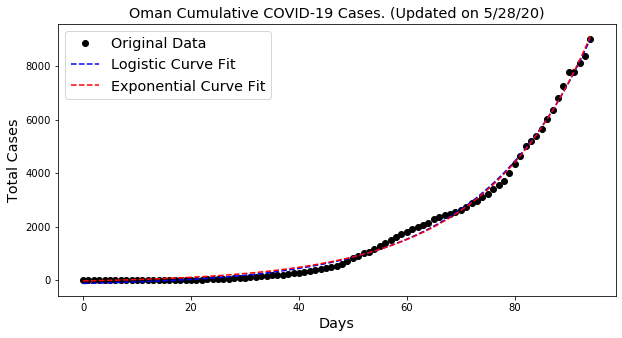



Algeria

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 8997.0
	Confirmed cases on 5/21/20 	 7728.0
	Ratio: 1.16
	Weekly increase: 16.4 %
	Daily increase: 2.2 % per day
	Doubling Time (represents recent growth): 31.9 days

** Based on Logistic Fit**

	R^2: 0.9982006166746713
	Doubling Time (during middle of growth):  27.25 (± 1.8 ) days


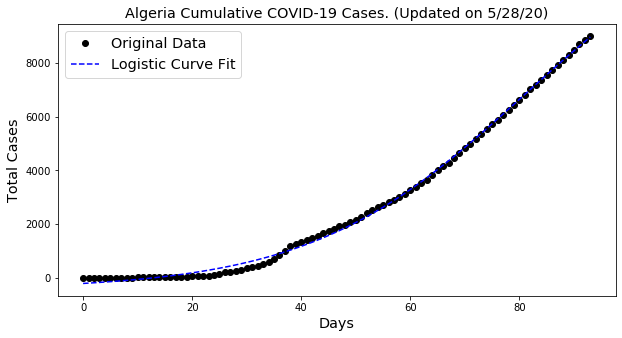



Nigeria

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 8915.0
	Confirmed cases on 5/21/20 	 7016.0
	Ratio: 1.27
	Weekly increase: 27.1 %
	Daily increase: 3.5 % per day
	Doubling Time (represents recent growth): 20.3 days

** Based on Logistic Fit**

	R^2: 0.9986082311556461
	Doubling Time (during middle of growth):  13.52 (± 0.55 ) days

** Based on Exponential Fit **

	R^2: 0.9819121583381809
	Doubling Time (represents overall growth):  12.76 (± 0.89 ) days


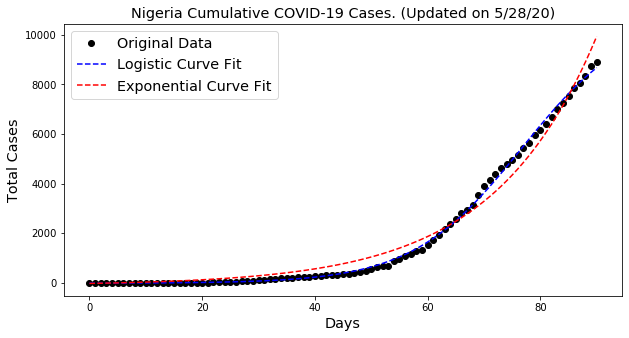



Norway

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 8411.0
	Confirmed cases on 5/21/20 	 8309.0
	Ratio: 1.01
	Weekly increase: 1.2 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 397.7 days

** Based on Logistic Fit**

	R^2: 0.9972245171113128
	Doubling Time (during middle of growth):  14.04 (± 0.73 ) days


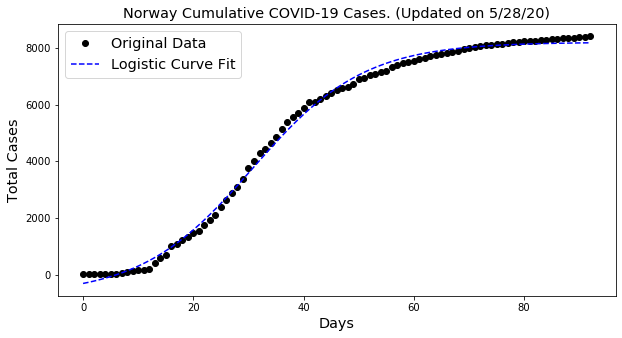



Bolivia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 8387.0
	Confirmed cases on 5/21/20 	 5187.0
	Ratio: 1.62
	Weekly increase: 61.7 %
	Daily increase: 7.1 % per day
	Doubling Time (represents recent growth): 10.1 days

** Based on Logistic Fit**

	R^2: 0.9994055584763696
	Doubling Time (during middle of growth):  20.31 (± 0.88 ) days

** Based on Exponential Fit **

	R^2: 0.9993526538122305
	Doubling Time (represents overall growth):  10.73 (± 0.14 ) days


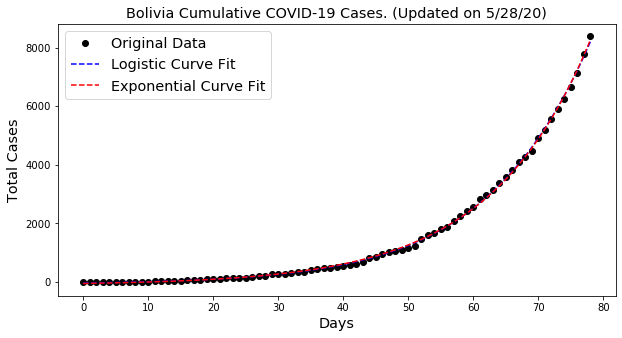



Armenia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 8216.0
	Confirmed cases on 5/21/20 	 5606.0
	Ratio: 1.47
	Weekly increase: 46.6 %
	Daily increase: 5.6 % per day
	Doubling Time (represents recent growth): 12.7 days

** Based on Logistic Fit**

	R^2: 0.9964522360797449
	Doubling Time (during middle of growth):  29.39 (± 0.96 ) days

** Based on Exponential Fit **

	R^2: 0.9959979197202378
	Doubling Time (represents overall growth):  13.89 (± 0.47 ) days


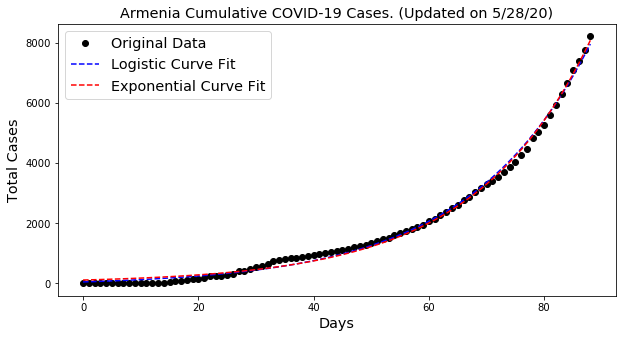



Moldova

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 7725.0
	Confirmed cases on 5/21/20 	 6704.0
	Ratio: 1.15
	Weekly increase: 15.2 %
	Daily increase: 2.0 % per day
	Doubling Time (represents recent growth): 34.2 days

** Based on Logistic Fit**

	R^2: 0.9959270759525938
	Doubling Time (during middle of growth):  26.48 (± 3.07 ) days


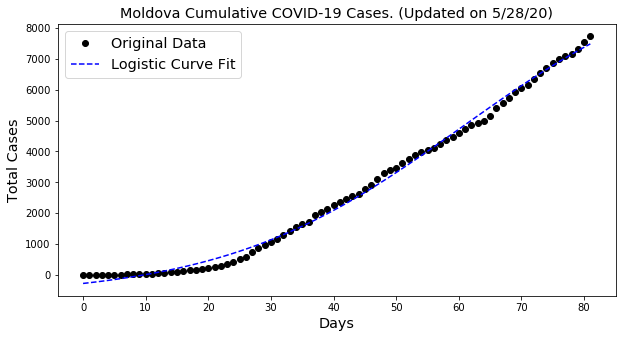



Morocco

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 7643.0
	Confirmed cases on 5/21/20 	 7211.0
	Ratio: 1.06
	Weekly increase: 6.0 %
	Daily increase: 0.8 % per day
	Doubling Time (represents recent growth): 83.4 days

** Based on Logistic Fit**

	R^2: 0.9987580164131471
	Doubling Time (during middle of growth):  17.09 (± 0.67 ) days


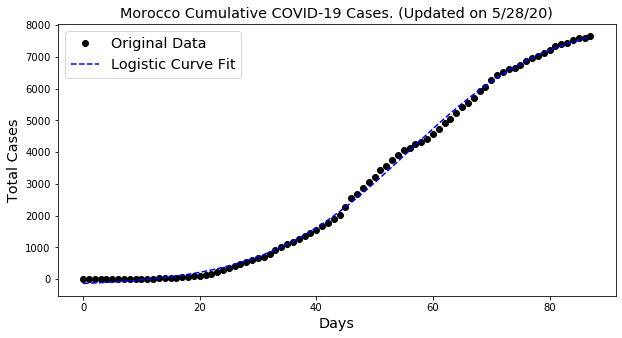



Malaysia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 7629.0
	Confirmed cases on 5/21/20 	 7059.0
	Ratio: 1.08
	Weekly increase: 8.1 %
	Daily increase: 1.1 % per day
	Doubling Time (represents recent growth): 62.5 days

** Based on Logistic Fit**

	R^2: 0.9944566025612834
	Doubling Time (during middle of growth):  15.12 (± 0.91 ) days


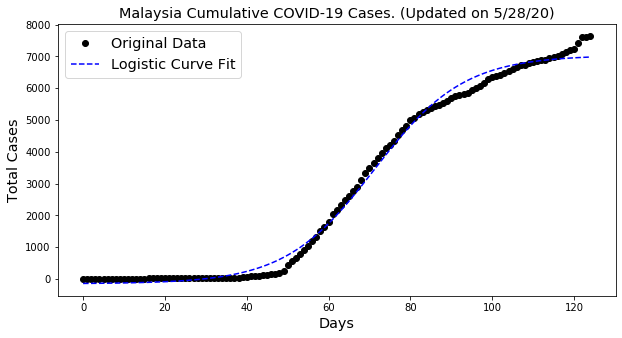



Ghana

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 7303.0
	Confirmed cases on 5/21/20 	 6269.0
	Ratio: 1.16
	Weekly increase: 16.5 %
	Daily increase: 2.2 % per day
	Doubling Time (represents recent growth): 31.8 days

** Based on Logistic Fit**

	R^2: 0.9950446444936433
	Doubling Time (during middle of growth):  11.38 (± 0.9 ) days


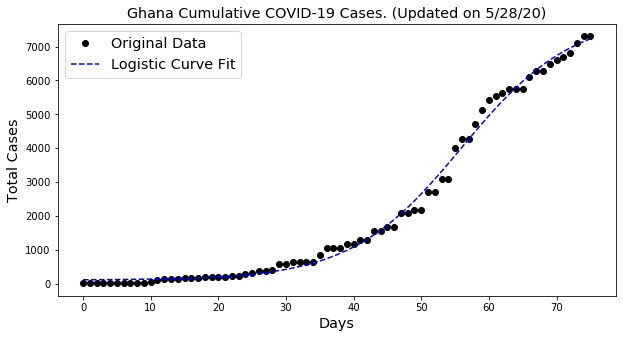



Australia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 7165.0
	Confirmed cases on 5/21/20 	 7095.0
	Ratio: 1.01
	Weekly increase: 1.0 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 494.2 days

** Based on Logistic Fit**

	R^2: 0.9981022850382477
	Doubling Time (during middle of growth):  6.74 (± 0.3 ) days


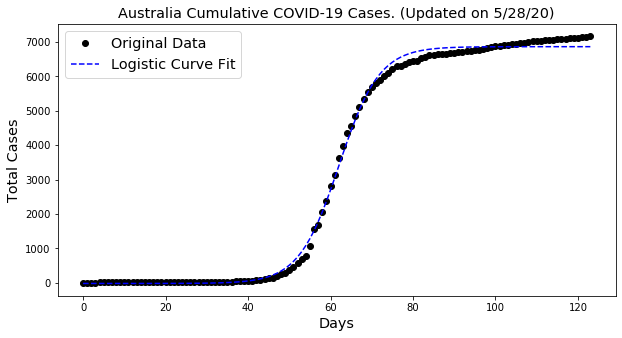



Finland

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 6743.0
	Confirmed cases on 5/21/20 	 6493.0
	Ratio: 1.04
	Weekly increase: 3.9 %
	Daily increase: 0.5 % per day
	Doubling Time (represents recent growth): 128.4 days

** Based on Logistic Fit**

	R^2: 0.9983745106174421
	Doubling Time (during middle of growth):  17.47 (± 0.59 ) days


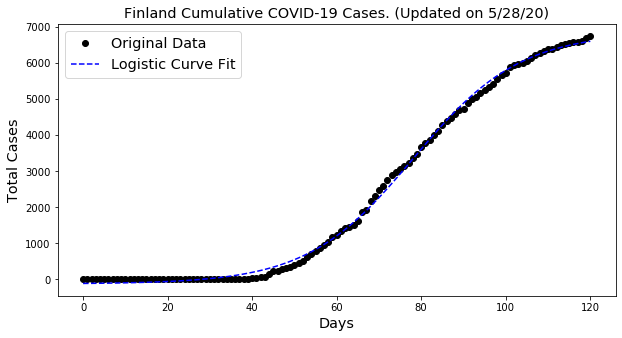



Iraq

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 5457.0
	Confirmed cases on 5/21/20 	 3877.0
	Ratio: 1.41
	Weekly increase: 40.8 %
	Daily increase: 5.0 % per day
	Doubling Time (represents recent growth): 14.2 days

** Based on Logistic Fit**

	R^2: 0.9905189924955399
	Doubling Time (during middle of growth):  53.6 (± 4.97 ) days

** Based on Exponential Fit **

	R^2: 0.9645058063053877
	Doubling Time (represents overall growth):  16.31 (± 1.65 ) days


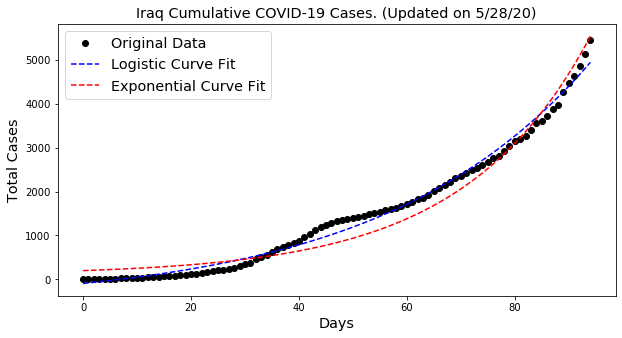



Cameroon

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 5436.0
	Confirmed cases on 5/21/20 	 4288.0
	Ratio: 1.27
	Weekly increase: 26.8 %
	Daily increase: 3.4 % per day
	Doubling Time (represents recent growth): 20.5 days

** Based on Logistic Fit**

	R^2: 0.9915169915635675
	Doubling Time (during middle of growth):  37.85 (± 3.52 ) days

** Based on Exponential Fit **

	R^2: 0.9817288810113776
	Doubling Time (represents overall growth):  14.2 (± 1.1 ) days


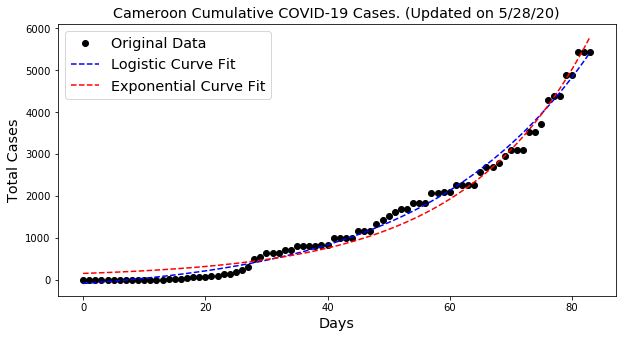



Azerbaijan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 4759.0
	Confirmed cases on 5/21/20 	 3749.0
	Ratio: 1.27
	Weekly increase: 26.9 %
	Daily increase: 3.5 % per day
	Doubling Time (represents recent growth): 20.3 days

** Based on Logistic Fit**

	R^2: 0.9910893824253163
	Doubling Time (during middle of growth):  51.9 (± 6.09 ) days

** Based on Exponential Fit **

	R^2: 0.9643959410035111
	Doubling Time (represents overall growth):  15.56 (± 1.69 ) days


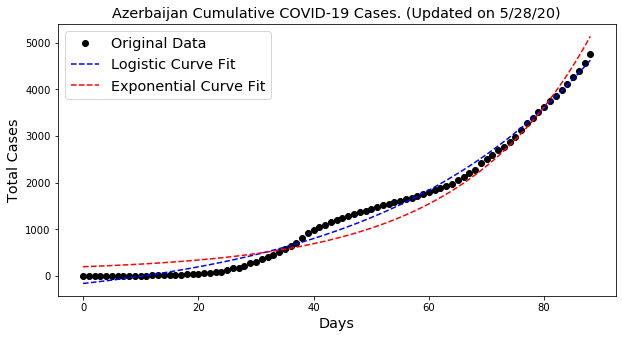



Honduras

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 4752.0
	Confirmed cases on 5/21/20 	 3204.0
	Ratio: 1.48
	Weekly increase: 48.3 %
	Daily increase: 5.8 % per day
	Doubling Time (represents recent growth): 12.3 days

** Based on Logistic Fit**

	R^2: 0.9945652165875503
	Doubling Time (during middle of growth):  20.98 (± 2.71 ) days

** Based on Exponential Fit **

	R^2: 0.9941084008783823
	Doubling Time (represents overall growth):  12.66 (± 0.55 ) days


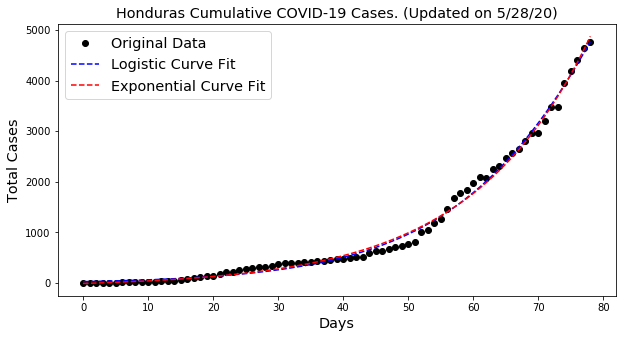



Guatemala

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 4348.0
	Confirmed cases on 5/21/20 	 2512.0
	Ratio: 1.73
	Weekly increase: 73.1 %
	Daily increase: 8.2 % per day
	Doubling Time (represents recent growth): 8.8 days

** Based on Logistic Fit**

	R^2: 0.9963903114579733
	Doubling Time (during middle of growth):  17.66 (± 0.68 ) days

** Based on Exponential Fit **

	R^2: 0.9963903117010037
	Doubling Time (represents overall growth):  8.83 (± 0.27 ) days


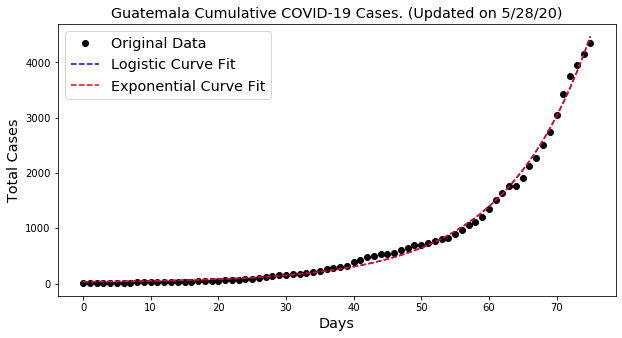



Sudan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 4346.0
	Confirmed cases on 5/21/20 	 3138.0
	Ratio: 1.38
	Weekly increase: 38.5 %
	Daily increase: 4.8 % per day
	Doubling Time (represents recent growth): 14.9 days

** Based on Logistic Fit**

	R^2: 0.9984423534882353
	Doubling Time (during middle of growth):  11.29 (± 0.55 ) days

** Based on Exponential Fit **

	R^2: 0.9886755207024266
	Doubling Time (represents overall growth):  9.78 (± 0.55 ) days


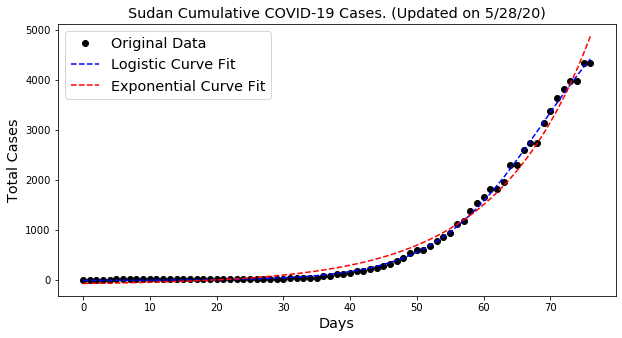



Luxembourg

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 4008.0
	Confirmed cases on 5/21/20 	 3980.0
	Ratio: 1.01
	Weekly increase: 0.7 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 692.1 days

** Based on Logistic Fit**

	R^2: 0.9954230210888977
	Doubling Time (during middle of growth):  9.53 (± 0.63 ) days


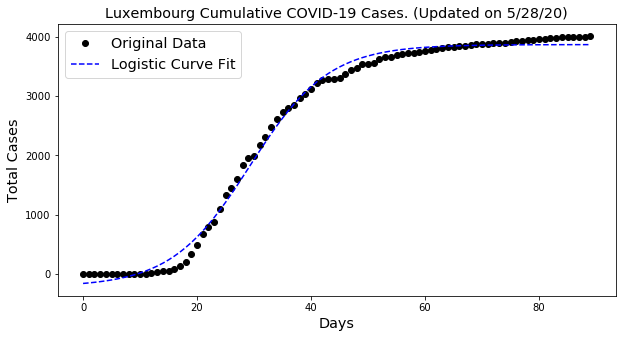



Hungary

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 3816.0
	Confirmed cases on 5/21/20 	 3641.0
	Ratio: 1.05
	Weekly increase: 4.8 %
	Daily increase: 0.7 % per day
	Doubling Time (represents recent growth): 103.4 days

** Based on Logistic Fit**

	R^2: 0.998623833211228
	Doubling Time (during middle of growth):  15.32 (± 0.6 ) days


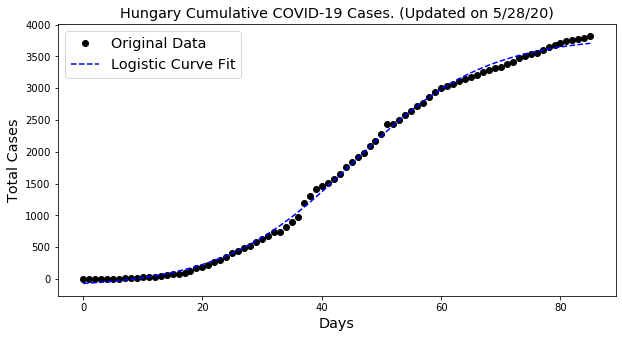



Tajikistan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 3563.0
	Confirmed cases on 5/21/20 	 2350.0
	Ratio: 1.52
	Weekly increase: 51.6 %
	Daily increase: 6.1 % per day
	Doubling Time (represents recent growth): 11.7 days

** Based on Logistic Fit**

	R^2: 0.9969528942230749
	Doubling Time (during middle of growth):  7.84 (± 1.16 ) days


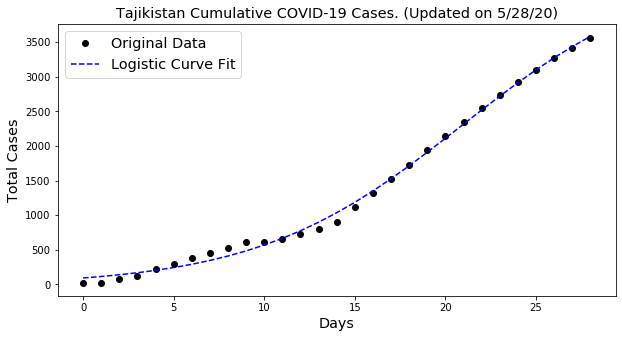



Guinea

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 3553.0
	Confirmed cases on 5/21/20 	 3067.0
	Ratio: 1.16
	Weekly increase: 15.8 %
	Daily increase: 2.1 % per day
	Doubling Time (represents recent growth): 33.0 days

** Based on Logistic Fit**

	R^2: 0.9975849014702659
	Doubling Time (during middle of growth):  16.17 (± 1.01 ) days


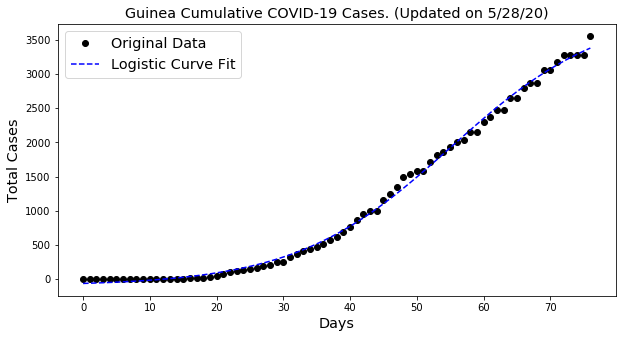



Uzbekistan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 3444.0
	Confirmed cases on 5/21/20 	 2964.0
	Ratio: 1.16
	Weekly increase: 16.2 %
	Daily increase: 2.2 % per day
	Doubling Time (represents recent growth): 32.3 days

** Based on Logistic Fit**

	R^2: 0.9859333775266651
	Doubling Time (during middle of growth):  21.86 (± 4.3 ) days


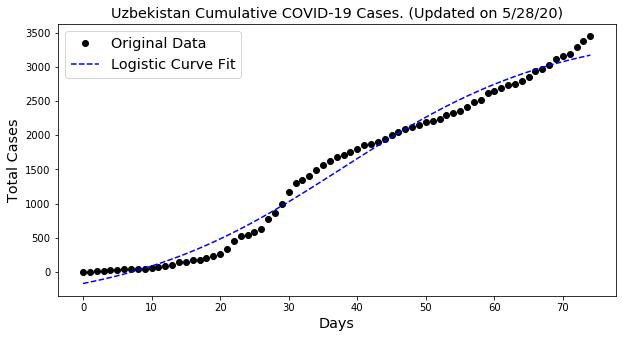



Senegal

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 3348.0
	Confirmed cases on 5/21/20 	 2812.0
	Ratio: 1.19
	Weekly increase: 19.1 %
	Daily increase: 2.5 % per day
	Doubling Time (represents recent growth): 27.8 days

** Based on Logistic Fit**

	R^2: 0.9982569888819681
	Doubling Time (during middle of growth):  14.54 (± 0.68 ) days

** Based on Exponential Fit **

	R^2: 0.9845020500149586
	Doubling Time (represents overall growth):  15.28 (± 1.09 ) days


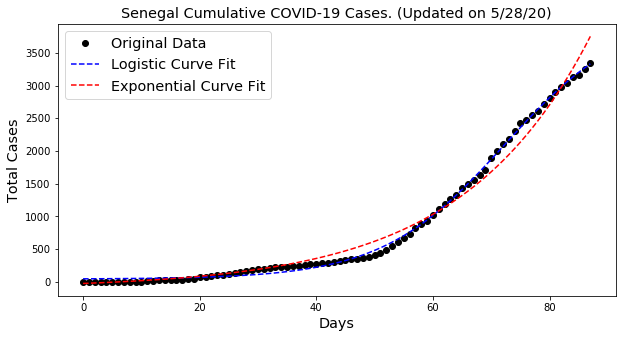



Thailand

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 3065.0
	Confirmed cases on 5/21/20 	 3037.0
	Ratio: 1.01
	Weekly increase: 0.9 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 528.7 days

** Based on Logistic Fit**

	R^2: 0.9981400486232013
	Doubling Time (during middle of growth):  8.55 (± 0.34 ) days


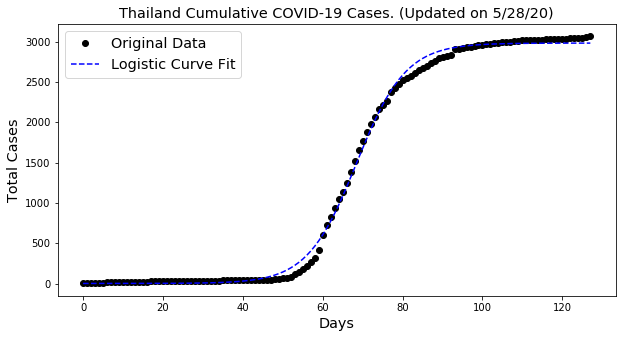



Djibouti

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 2914.0
	Confirmed cases on 5/21/20 	 2047.0
	Ratio: 1.42
	Weekly increase: 42.4 %
	Daily increase: 5.2 % per day
	Doubling Time (represents recent growth): 13.7 days


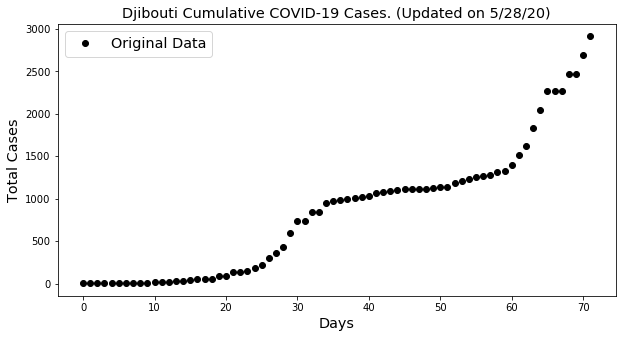



Greece

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 2906.0
	Confirmed cases on 5/21/20 	 2853.0
	Ratio: 1.02
	Weekly increase: 1.9 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 263.6 days

** Based on Logistic Fit**

	R^2: 0.9965645091797276
	Doubling Time (during middle of growth):  14.64 (± 0.84 ) days


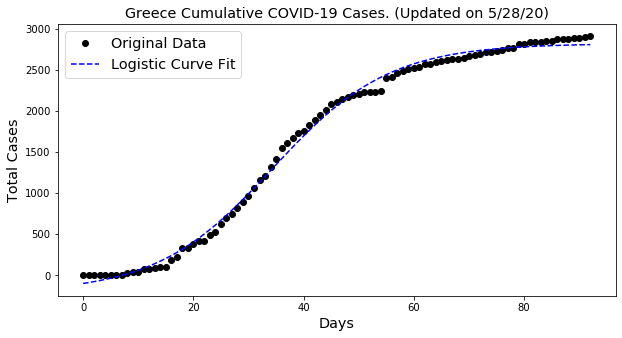



Congo (Kinshasa)

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 2660.0
	Confirmed cases on 5/21/20 	 1835.0
	Ratio: 1.45
	Weekly increase: 45.0 %
	Daily increase: 5.4 % per day
	Doubling Time (represents recent growth): 13.1 days

** Based on Logistic Fit**

	R^2: 0.9990202281669863
	Doubling Time (during middle of growth):  25.85 (± inf ) days

** Based on Exponential Fit **

	R^2: 0.9990202282357356
	Doubling Time (represents overall growth):  12.93 (± 0.23 ) days


C:\OSGEO4~1\apps\Python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning:

Covariance of the parameters could not be estimated



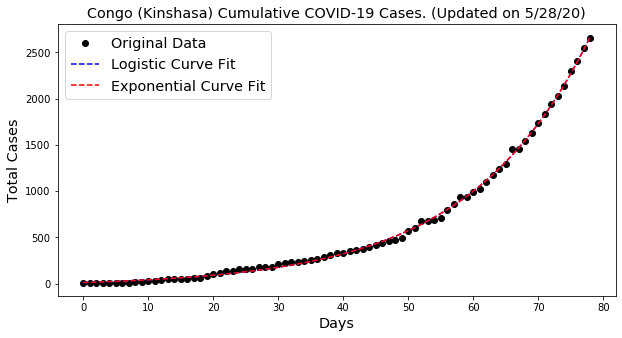



Cote d'Ivoire

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 2641.0
	Confirmed cases on 5/21/20 	 2301.0
	Ratio: 1.15
	Weekly increase: 14.8 %
	Daily increase: 2.0 % per day
	Doubling Time (represents recent growth): 35.2 days

** Based on Logistic Fit**

	R^2: 0.9977974310686112
	Doubling Time (during middle of growth):  26.62 (± 2.43 ) days


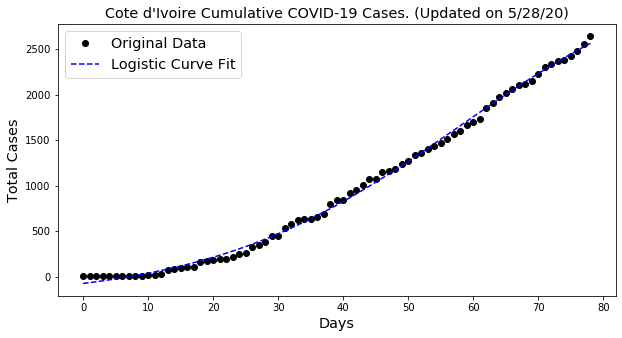



Bulgaria

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 2477.0
	Confirmed cases on 5/21/20 	 2331.0
	Ratio: 1.06
	Weekly increase: 6.3 %
	Daily increase: 0.9 % per day
	Doubling Time (represents recent growth): 79.9 days

** Based on Logistic Fit**

	R^2: 0.9978920091450088
	Doubling Time (during middle of growth):  22.94 (± 1.6 ) days


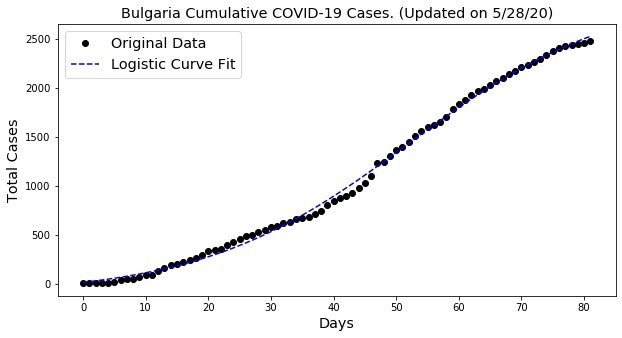



Bosnia and Herzegovina

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 2462.0
	Confirmed cases on 5/21/20 	 2350.0
	Ratio: 1.05
	Weekly increase: 4.8 %
	Daily increase: 0.7 % per day
	Doubling Time (represents recent growth): 104.2 days

** Based on Logistic Fit**

	R^2: 0.9975133979896107
	Doubling Time (during middle of growth):  20.39 (± 1.3 ) days


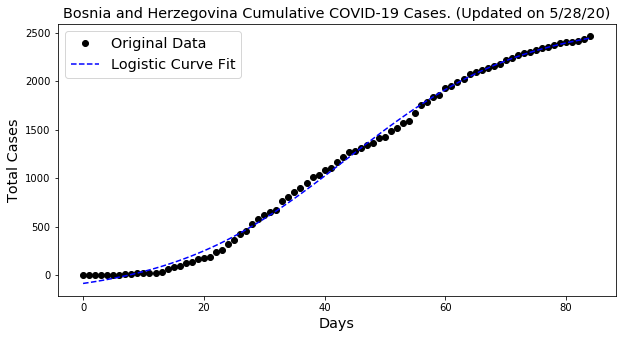



Gabon

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 2431.0
	Confirmed cases on 5/21/20 	 1567.0
	Ratio: 1.55
	Weekly increase: 55.1 %
	Daily increase: 6.5 % per day
	Doubling Time (represents recent growth): 11.0 days

** Based on Logistic Fit**

	R^2: 0.9970470941943859
	Doubling Time (during middle of growth):  12.2 (± 0.85 ) days

** Based on Exponential Fit **

	R^2: 0.9908422344587361
	Doubling Time (represents overall growth):  10.28 (± 0.53 ) days


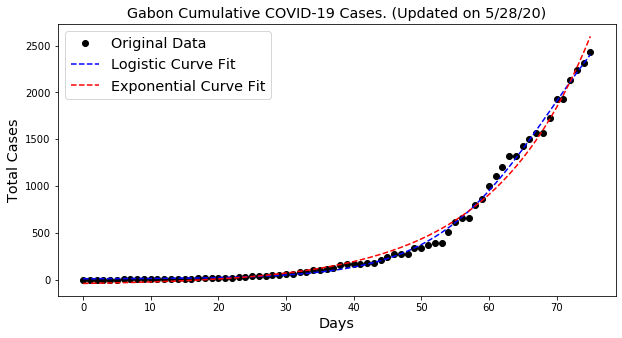



Croatia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 2245.0
	Confirmed cases on 5/21/20 	 2237.0
	Ratio: 1.0
	Weekly increase: 0.4 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 1359.2 days

** Based on Logistic Fit**

	R^2: 0.9976285550947256
	Doubling Time (during middle of growth):  11.28 (± 0.51 ) days


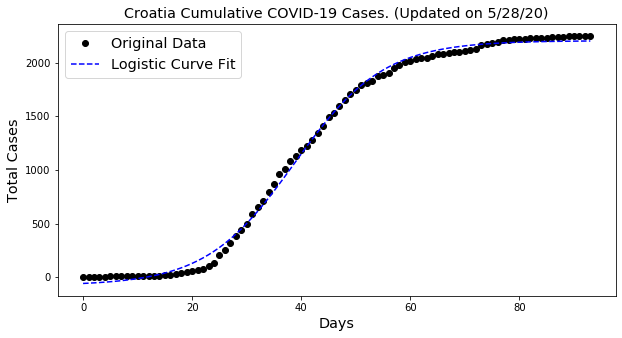



El Salvador

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 2194.0
	Confirmed cases on 5/21/20 	 1640.0
	Ratio: 1.34
	Weekly increase: 33.8 %
	Daily increase: 4.2 % per day
	Doubling Time (represents recent growth): 16.7 days

** Based on Logistic Fit**

	R^2: 0.9991097230767455
	Doubling Time (during middle of growth):  15.77 (± 0.71 ) days

** Based on Exponential Fit **

	R^2: 0.995216741317185
	Doubling Time (represents overall growth):  13.12 (± 0.59 ) days


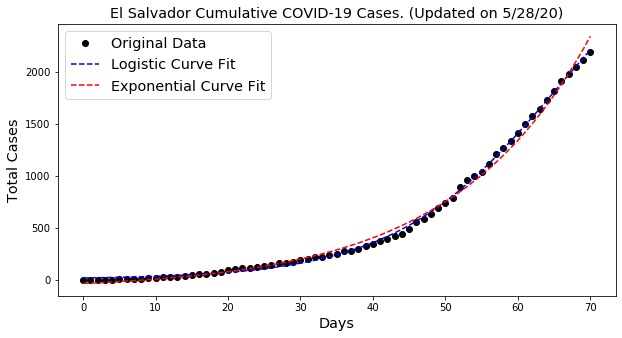



North Macedonia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 2077.0
	Confirmed cases on 5/21/20 	 1898.0
	Ratio: 1.09
	Weekly increase: 9.4 %
	Daily increase: 1.3 % per day
	Doubling Time (represents recent growth): 53.8 days

** Based on Logistic Fit**

	R^2: 0.9932809569224672
	Doubling Time (during middle of growth):  16.88 (± 1.41 ) days


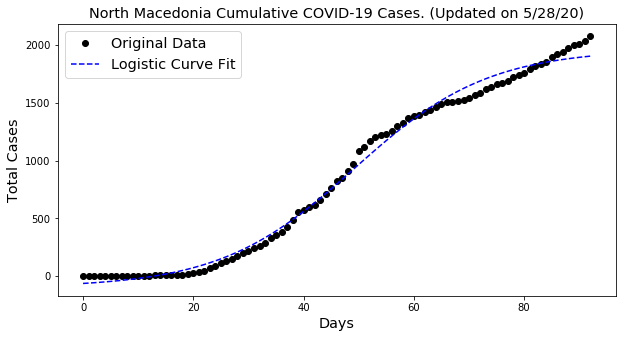



Cuba

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1983.0
	Confirmed cases on 5/21/20 	 1908.0
	Ratio: 1.04
	Weekly increase: 3.9 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 125.8 days

** Based on Logistic Fit**

	R^2: 0.9993366404454753
	Doubling Time (during middle of growth):  13.07 (± 0.36 ) days


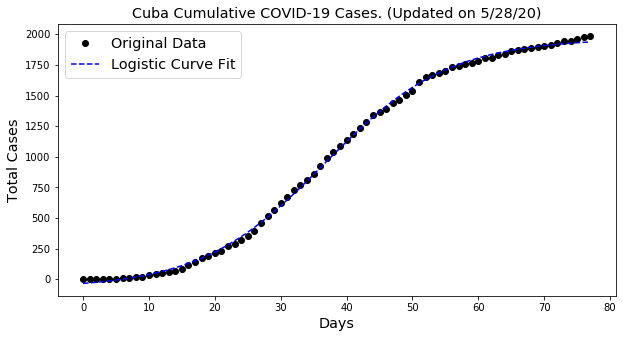



Estonia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1851.0
	Confirmed cases on 5/21/20 	 1800.0
	Ratio: 1.03
	Weekly increase: 2.8 %
	Daily increase: 0.4 % per day
	Doubling Time (represents recent growth): 173.7 days

** Based on Logistic Fit**

	R^2: 0.9978685267292225
	Doubling Time (during middle of growth):  12.89 (± 0.57 ) days


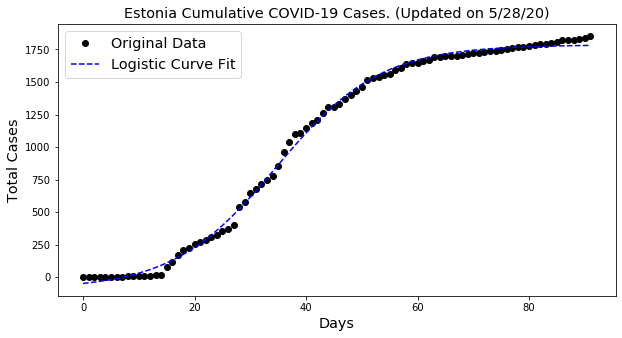



Somalia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1828.0
	Confirmed cases on 5/21/20 	 1594.0
	Ratio: 1.15
	Weekly increase: 14.7 %
	Daily increase: 2.0 % per day
	Doubling Time (represents recent growth): 35.4 days

** Based on Logistic Fit**

	R^2: 0.9975626470237199
	Doubling Time (during middle of growth):  12.86 (± 0.75 ) days

** Based on Exponential Fit **

	R^2: 0.9630591917455856
	Doubling Time (represents overall growth):  15.93 (± 2.25 ) days


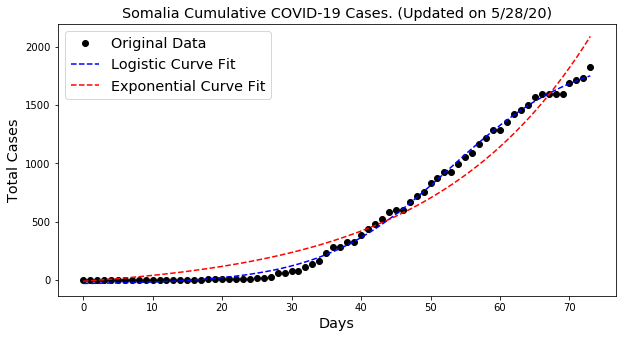



Iceland

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1805.0
	Confirmed cases on 5/21/20 	 1803.0
	Ratio: 1.0
	Weekly increase: 0.1 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 4376.5 days

** Based on Logistic Fit**

	R^2: 0.9996083787482489
	Doubling Time (during middle of growth):  7.94 (± 0.15 ) days


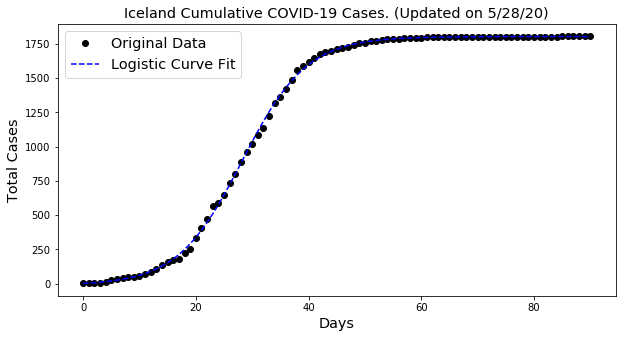



Lithuania

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1656.0
	Confirmed cases on 5/21/20 	 1593.0
	Ratio: 1.04
	Weekly increase: 4.0 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 125.1 days

** Based on Logistic Fit**

	R^2: 0.9928825067088064
	Doubling Time (during middle of growth):  12.05 (± 0.97 ) days


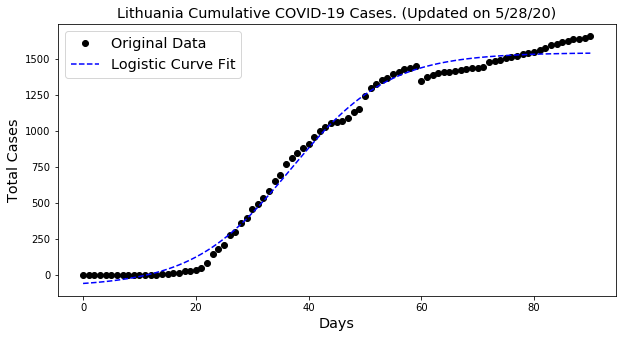



Kenya

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1618.0
	Confirmed cases on 5/21/20 	 1109.0
	Ratio: 1.46
	Weekly increase: 45.9 %
	Daily increase: 5.5 % per day
	Doubling Time (represents recent growth): 12.8 days

** Based on Logistic Fit**

	R^2: 0.9945512399971751
	Doubling Time (during middle of growth):  32.68 (± 2.17 ) days

** Based on Exponential Fit **

	R^2: 0.9945512404354268
	Doubling Time (represents overall growth):  16.34 (± 0.81 ) days


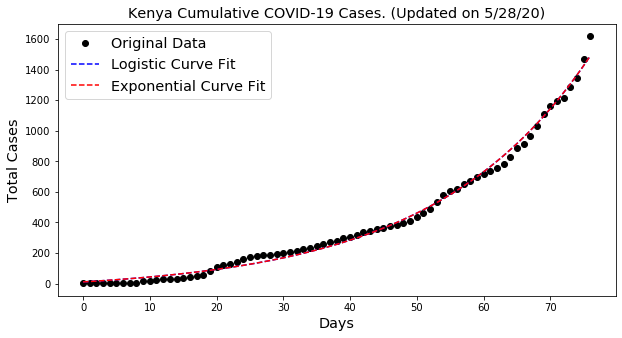



Kyrgyzstan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1594.0
	Confirmed cases on 5/21/20 	 1313.0
	Ratio: 1.21
	Weekly increase: 21.4 %
	Daily increase: 2.8 % per day
	Doubling Time (represents recent growth): 25.0 days

** Based on Logistic Fit**

	R^2: 0.9947597169358594
	Doubling Time (during middle of growth):  118.26 (± inf ) days


C:\OSGEO4~1\apps\Python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning:

Covariance of the parameters could not be estimated



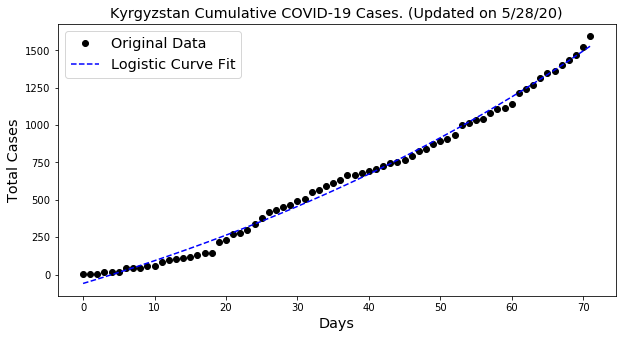



Sri Lanka

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1530.0
	Confirmed cases on 5/21/20 	 1055.0
	Ratio: 1.45
	Weekly increase: 45.0 %
	Daily increase: 5.5 % per day
	Doubling Time (represents recent growth): 13.1 days

** Based on Logistic Fit**

	R^2: 0.9860092701389835
	Doubling Time (during middle of growth):  22.29 (± 2.63 ) days

** Based on Exponential Fit **

	R^2: 0.9782454763440042
	Doubling Time (represents overall growth):  21.67 (± 1.53 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp



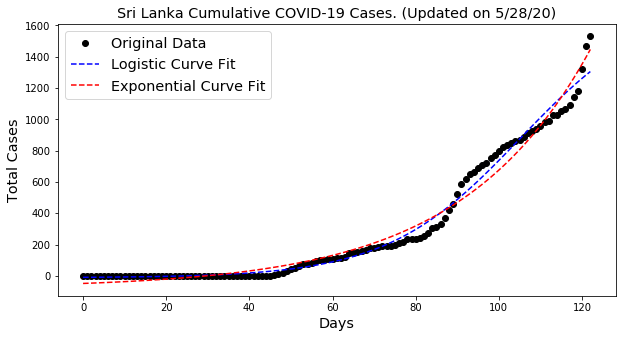



Slovakia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1520.0
	Confirmed cases on 5/21/20 	 1502.0
	Ratio: 1.01
	Weekly increase: 1.2 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 407.3 days

** Based on Logistic Fit**

	R^2: 0.9963182280911499
	Doubling Time (during middle of growth):  11.57 (± 0.7 ) days


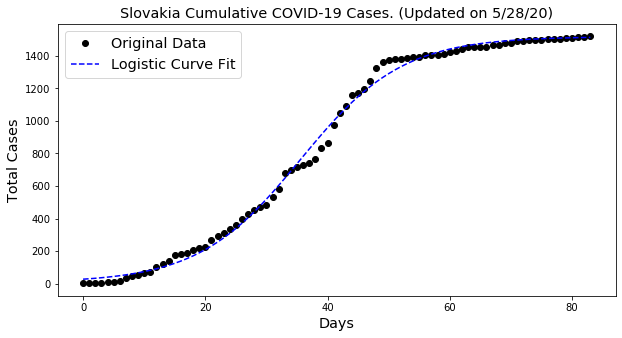



Maldives

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1513.0
	Confirmed cases on 5/21/20 	 1216.0
	Ratio: 1.24
	Weekly increase: 24.4 %
	Daily increase: 3.2 % per day
	Doubling Time (represents recent growth): 22.2 days

** Based on Logistic Fit**

	R^2: 0.9944761317186105
	Doubling Time (during middle of growth):  10.55 (± 0.83 ) days

** Based on Exponential Fit **

	R^2: 0.9641989227606824
	Doubling Time (represents overall growth):  14.96 (± 1.73 ) days


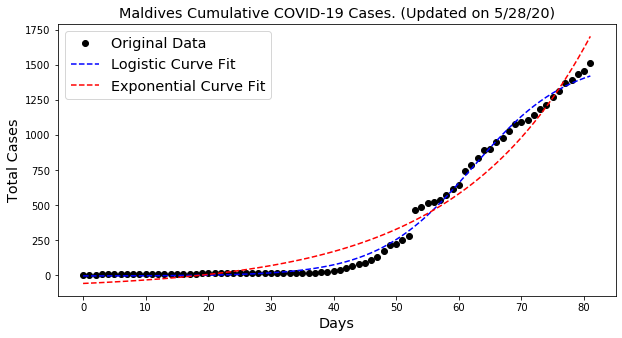



New Zealand

** Based on Logistic Fit**

	R^2: 0.9990545165805919
	Doubling Time (during middle of growth):  6.36 (± 0.21 ) days


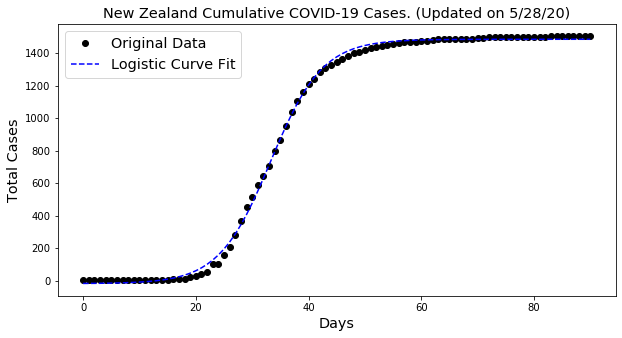



Slovenia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1473.0
	Confirmed cases on 5/21/20 	 1468.0
	Ratio: 1.0
	Weekly increase: 0.3 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 1427.0 days

** Based on Logistic Fit**

	R^2: 0.9993632546811575
	Doubling Time (during middle of growth):  13.33 (± 0.36 ) days


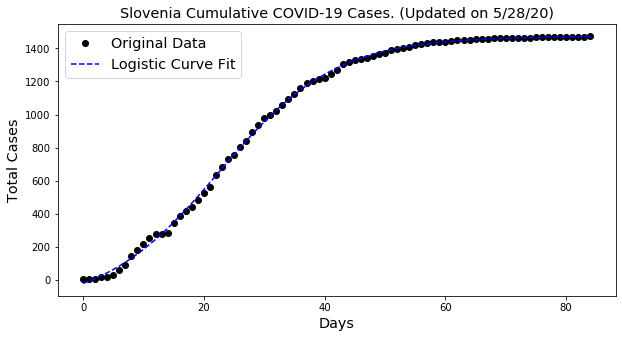



Venezuela

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1325.0
	Confirmed cases on 5/21/20 	 882.0
	Ratio: 1.5
	Weekly increase: 50.2 %
	Daily increase: 6.0 % per day
	Doubling Time (represents recent growth): 11.9 days

** Based on Logistic Fit**

	R^2: 0.9618963325390841
	Doubling Time (during middle of growth):  19.82 (± 1.99 ) days

** Based on Exponential Fit **

	R^2: 0.9617182594213146
	Doubling Time (represents overall growth):  10.2 (± 1.09 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:44: RuntimeWarning:

invalid value encountered in sqrt



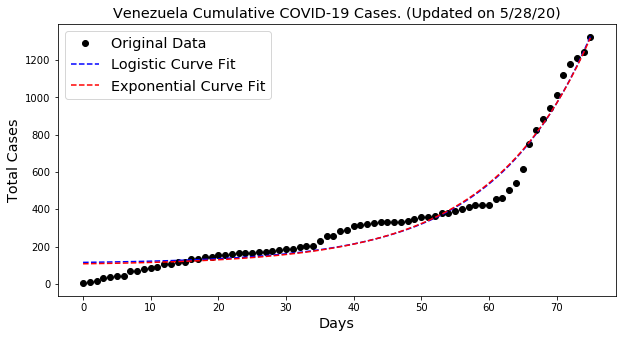



Haiti

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1320.0
	Confirmed cases on 5/21/20 	 734.0
	Ratio: 1.8
	Weekly increase: 79.8 %
	Daily increase: 8.7 % per day
	Doubling Time (represents recent growth): 8.3 days

** Based on Logistic Fit**

	R^2: 0.9938679846519867
	Doubling Time (during middle of growth):  9.63 (± 1.06 ) days

** Based on Exponential Fit **

	R^2: 0.9923179201369009
	Doubling Time (represents overall growth):  6.25 (± 0.28 ) days


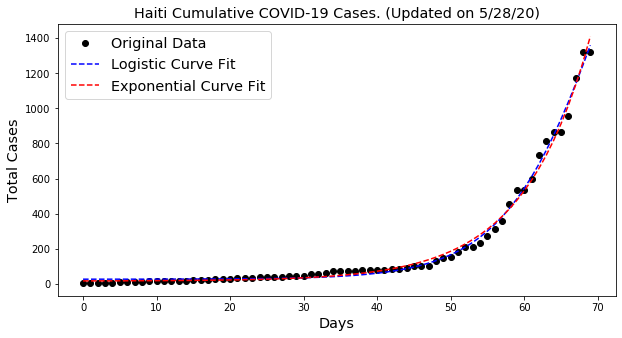



Guinea-Bissau

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1195.0
	Confirmed cases on 5/21/20 	 1109.0
	Ratio: 1.08
	Weekly increase: 7.8 %
	Daily increase: 1.1 % per day
	Doubling Time (represents recent growth): 65.0 days

** Based on Logistic Fit**

	R^2: 0.9971982121689347
	Doubling Time (during middle of growth):  6.84 (± 0.42 ) days


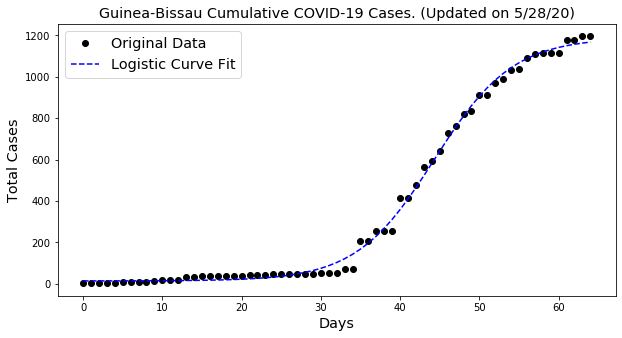



Mali

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1194.0
	Confirmed cases on 5/21/20 	 947.0
	Ratio: 1.26
	Weekly increase: 26.1 %
	Daily increase: 3.4 % per day
	Doubling Time (represents recent growth): 20.9 days

** Based on Logistic Fit**

	R^2: 0.9960214115473942
	Doubling Time (during middle of growth):  21.57 (± 2.86 ) days

** Based on Exponential Fit **

	R^2: 0.9594282632555455
	Doubling Time (represents overall growth):  17.1 (± 3.05 ) days


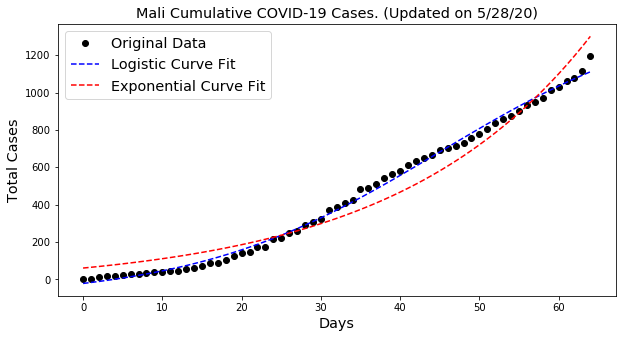



Lebanon

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1168.0
	Confirmed cases on 5/21/20 	 1024.0
	Ratio: 1.14
	Weekly increase: 14.1 %
	Daily increase: 1.9 % per day
	Doubling Time (represents recent growth): 36.9 days

** Based on Logistic Fit**

	R^2: 0.9698880332133504
	Doubling Time (during middle of growth):  66.59 (± 59.03 ) days


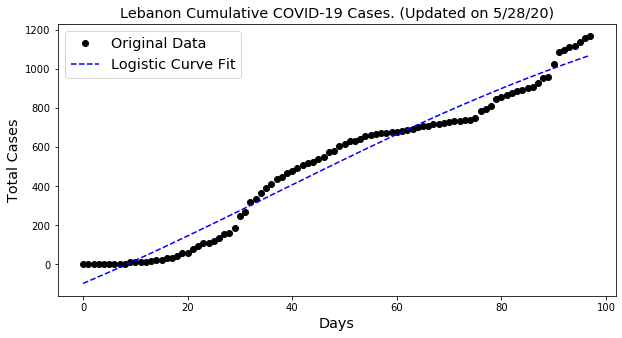



Albania

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1076.0
	Confirmed cases on 5/21/20 	 969.0
	Ratio: 1.11
	Weekly increase: 11.0 %
	Daily increase: 1.5 % per day
	Doubling Time (represents recent growth): 46.3 days

** Based on Logistic Fit**

	R^2: 0.9975328956783504
	Doubling Time (during middle of growth):  24.82 (± 2.07 ) days


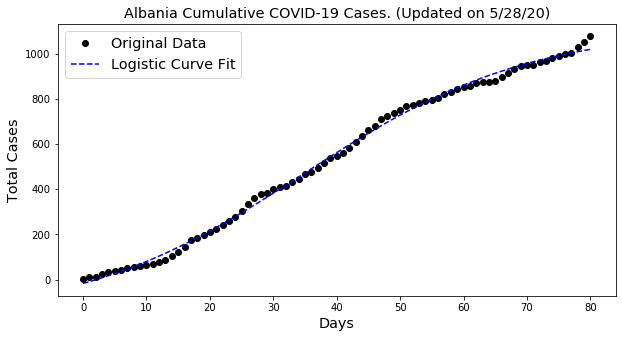



Tunisia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1068.0
	Confirmed cases on 5/21/20 	 1046.0
	Ratio: 1.02
	Weekly increase: 2.1 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 233.1 days

** Based on Logistic Fit**

	R^2: 0.9965540110088817
	Doubling Time (during middle of growth):  11.52 (± 0.67 ) days


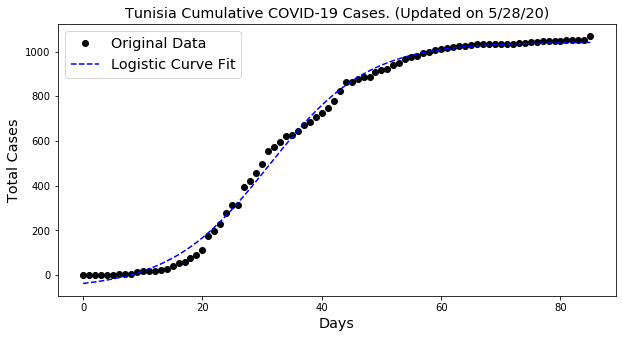



Latvia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1061.0
	Confirmed cases on 5/21/20 	 1025.0
	Ratio: 1.04
	Weekly increase: 3.5 %
	Daily increase: 0.5 % per day
	Doubling Time (represents recent growth): 140.6 days

** Based on Logistic Fit**

	R^2: 0.9923058063878907
	Doubling Time (during middle of growth):  20.62 (± 2.27 ) days


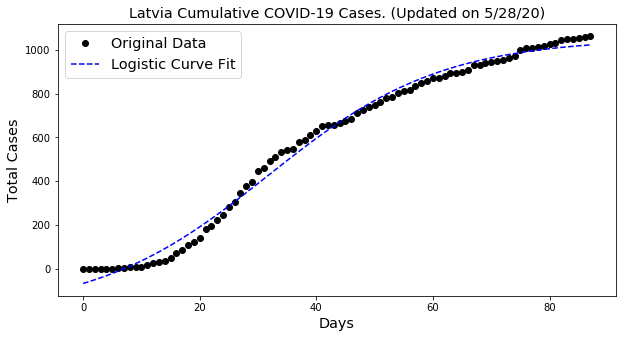



Zambia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1057.0
	Confirmed cases on 5/21/20 	 866.0
	Ratio: 1.22
	Weekly increase: 22.1 %
	Daily increase: 2.9 % per day
	Doubling Time (represents recent growth): 24.3 days

** Based on Logistic Fit**

	R^2: 0.9895144865578845
	Doubling Time (during middle of growth):  5.41 (± 0.63 ) days


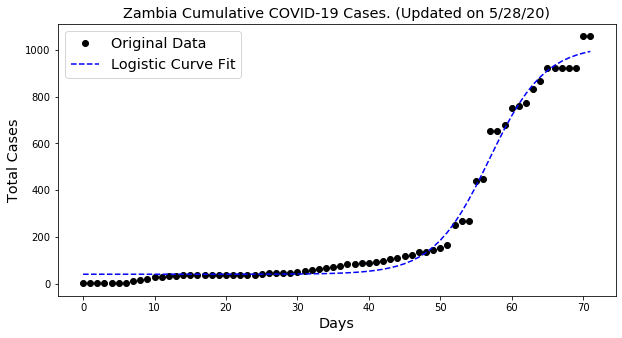



Kosovo

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1048.0
	Confirmed cases on 5/21/20 	 1003.0
	Ratio: 1.04
	Weekly increase: 4.5 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 110.6 days

** Based on Logistic Fit**

	R^2: 0.9908168072590126
	Doubling Time (during middle of growth):  11.32 (± 1.36 ) days


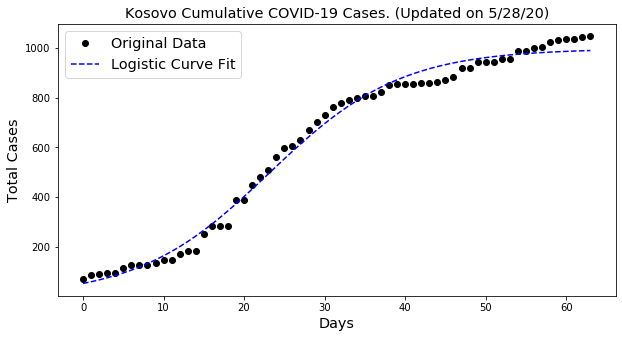



Equatorial Guinea

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1043.0
	Confirmed cases on 5/21/20 	 903.0
	Ratio: 1.16
	Weekly increase: 15.5 %
	Daily increase: 2.1 % per day
	Doubling Time (represents recent growth): 33.7 days

** Based on Logistic Fit**

	R^2: 0.983377252755533
	Doubling Time (during middle of growth):  18.75 (± 3.91 ) days

** Based on Exponential Fit **

	R^2: 0.9798892525602415
	Doubling Time (represents overall growth):  14.86 (± 1.39 ) days


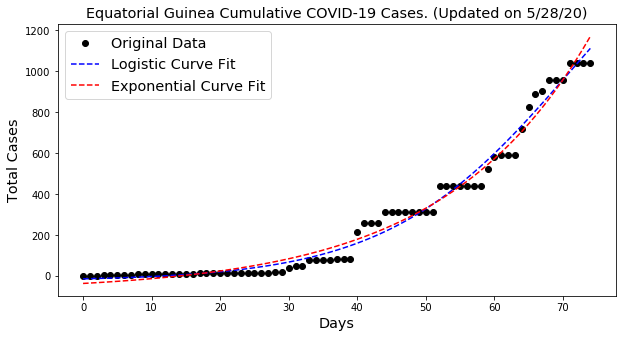



Nepal

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1042.0
	Confirmed cases on 5/21/20 	 457.0
	Ratio: 2.28
	Weekly increase: 128.0 %
	Daily increase: 12.5 % per day
	Doubling Time (represents recent growth): 5.9 days

** Based on Exponential Fit **

	R^2: 0.995313959660177
	Doubling Time (represents overall growth):  6.58 (± 0.16 ) days


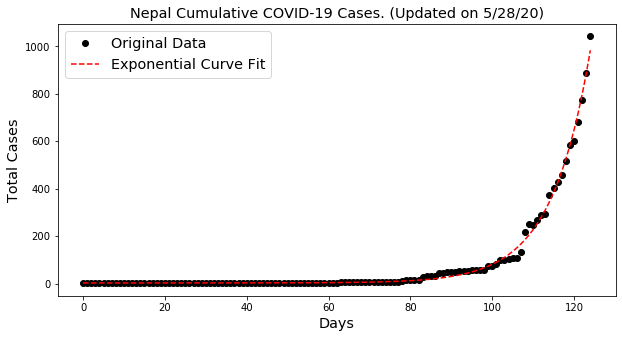



Costa Rica

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 1000.0
	Confirmed cases on 5/21/20 	 903.0
	Ratio: 1.11
	Weekly increase: 10.7 %
	Daily increase: 1.5 % per day
	Doubling Time (represents recent growth): 47.6 days

** Based on Logistic Fit**

	R^2: 0.9852106645549933
	Doubling Time (during middle of growth):  26.06 (± 5.46 ) days


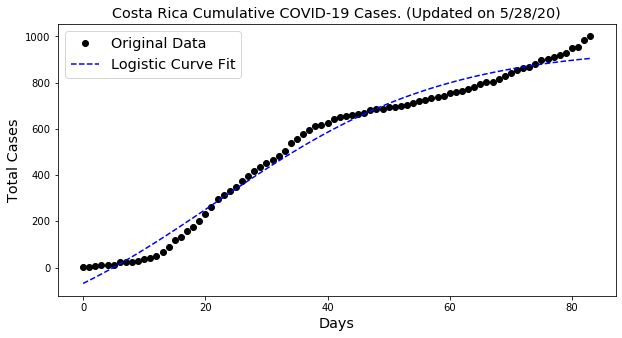



South Sudan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 994.0
	Confirmed cases on 5/21/20 	 481.0
	Ratio: 2.07
	Weekly increase: 106.7 %
	Daily increase: 10.9 % per day
	Doubling Time (represents recent growth): 6.7 days

** Based on Logistic Fit**

	R^2: 0.9882419645070486
	Doubling Time (during middle of growth):  10.44 (± 2.1 ) days

** Based on Exponential Fit **

	R^2: 0.9879260254080229
	Doubling Time (represents overall growth):  5.87 (± 0.39 ) days


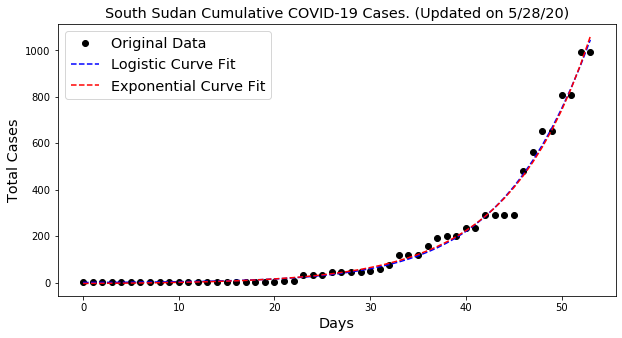



Niger

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 955.0
	Confirmed cases on 5/21/20 	 924.0
	Ratio: 1.03
	Weekly increase: 3.4 %
	Daily increase: 0.5 % per day
	Doubling Time (represents recent growth): 147.0 days

** Based on Logistic Fit**

	R^2: 0.9765701905820293
	Doubling Time (during middle of growth):  15.12 (± 3.19 ) days


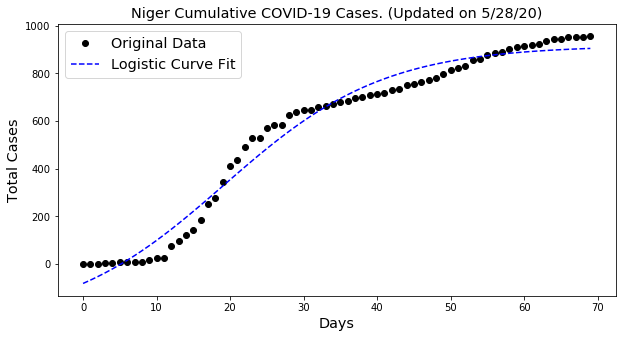



Cyprus

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 941.0
	Confirmed cases on 5/21/20 	 923.0
	Ratio: 1.02
	Weekly increase: 2.0 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 251.2 days

** Based on Logistic Fit**

	R^2: 0.9977317418475331
	Doubling Time (during middle of growth):  11.14 (± 0.55 ) days


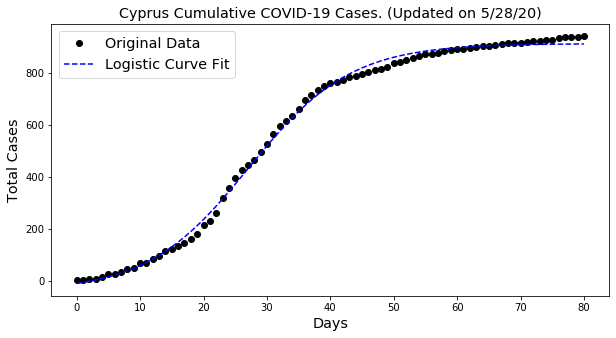



Paraguay

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 900.0
	Confirmed cases on 5/21/20 	 836.0
	Ratio: 1.08
	Weekly increase: 7.7 %
	Daily increase: 1.1 % per day
	Doubling Time (represents recent growth): 65.8 days

** Based on Logistic Fit**

	R^2: 0.9818397547450743
	Doubling Time (during middle of growth):  12.59 (± 1.85 ) days

** Based on Exponential Fit **

	R^2: 0.9598041052895215
	Doubling Time (represents overall growth):  21.27 (± 3.28 ) days


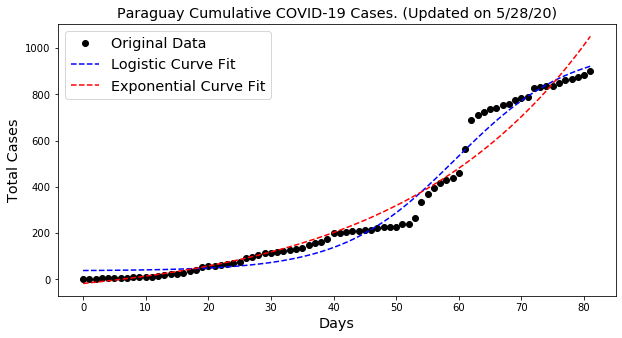



Burkina Faso

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 847.0
	Confirmed cases on 5/21/20 	 812.0
	Ratio: 1.04
	Weekly increase: 4.3 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 115.0 days

** Based on Logistic Fit**

	R^2: 0.9937922900815865
	Doubling Time (during middle of growth):  22.3 (± 2.74 ) days


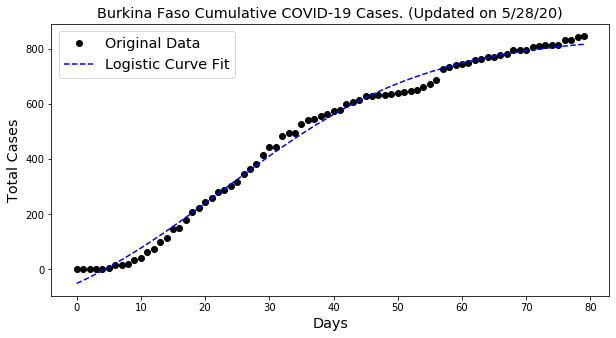



Ethiopia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 831.0
	Confirmed cases on 5/21/20 	 399.0
	Ratio: 2.08
	Weekly increase: 108.3 %
	Daily increase: 11.0 % per day
	Doubling Time (represents recent growth): 6.6 days

** Based on Logistic Fit**

	R^2: 0.9790932128077819
	Doubling Time (during middle of growth):  18.33 (± 1.55 ) days

** Based on Exponential Fit **

	R^2: 0.9790932136710625
	Doubling Time (represents overall growth):  9.17 (± 0.69 ) days


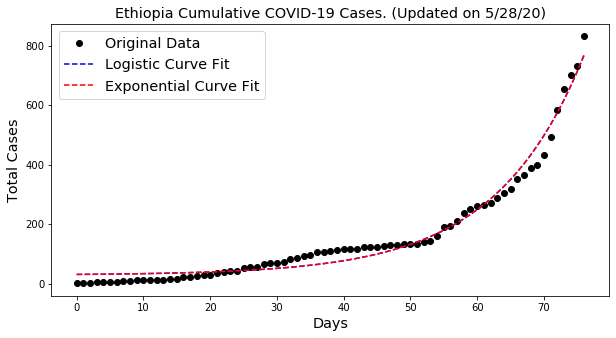



Sierra Leone

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 812.0
	Confirmed cases on 5/21/20 	 585.0
	Ratio: 1.39
	Weekly increase: 38.8 %
	Daily increase: 4.8 % per day
	Doubling Time (represents recent growth): 14.8 days

** Based on Logistic Fit**

	R^2: 0.9983257693493216
	Doubling Time (during middle of growth):  14.2 (± 0.99 ) days

** Based on Exponential Fit **

	R^2: 0.9929462184127102
	Doubling Time (represents overall growth):  13.67 (± 0.94 ) days


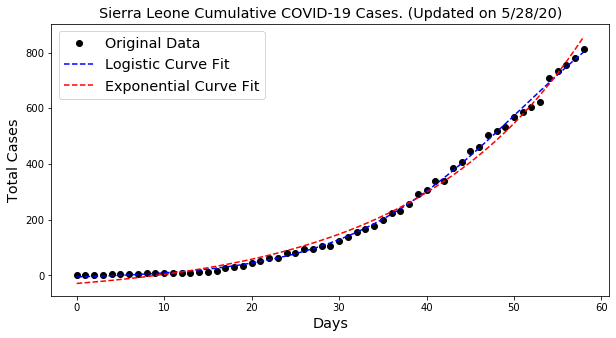



Uruguay

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 811.0
	Confirmed cases on 5/21/20 	 749.0
	Ratio: 1.08
	Weekly increase: 8.3 %
	Daily increase: 1.1 % per day
	Doubling Time (represents recent growth): 61.0 days

** Based on Logistic Fit**

	R^2: 0.995160800635957
	Doubling Time (during middle of growth):  54.92 (± 11.48 ) days


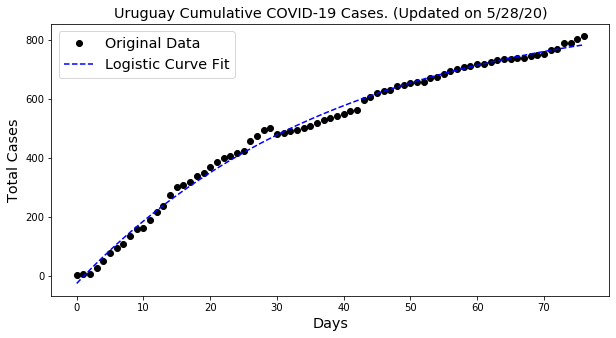



Andorra

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 763.0
	Confirmed cases on 5/21/20 	 762.0
	Ratio: 1.0
	Weekly increase: 0.1 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 3699.7 days

** Based on Logistic Fit**

	R^2: 0.9980531857558189
	Doubling Time (during middle of growth):  9.27 (± 0.4 ) days


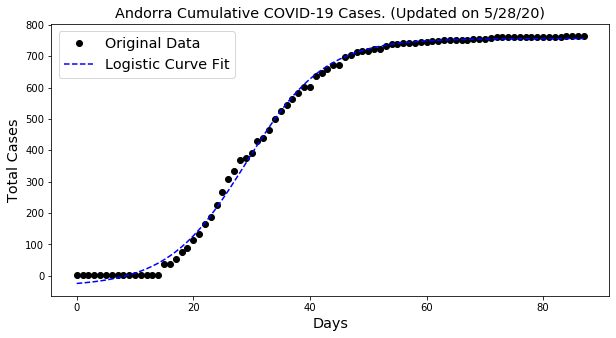



Nicaragua

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 759.0
	Confirmed cases on 5/21/20 	 279.0
	Ratio: 2.72
	Weekly increase: 172.0 %
	Daily increase: 15.4 % per day
	Doubling Time (represents recent growth): 4.8 days


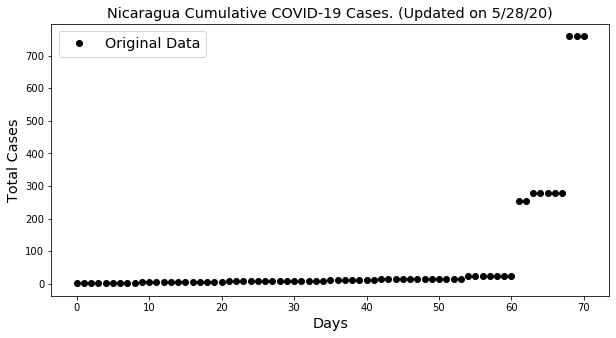



Central African Republic

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 755.0
	Confirmed cases on 5/21/20 	 436.0
	Ratio: 1.73
	Weekly increase: 73.2 %
	Daily increase: 8.2 % per day
	Doubling Time (represents recent growth): 8.8 days

** Based on Logistic Fit**

	R^2: 0.9920725269634745
	Doubling Time (during middle of growth):  10.36 (± 1.2 ) days

** Based on Exponential Fit **

	R^2: 0.9879410358975345
	Doubling Time (represents overall growth):  7.64 (± 0.43 ) days


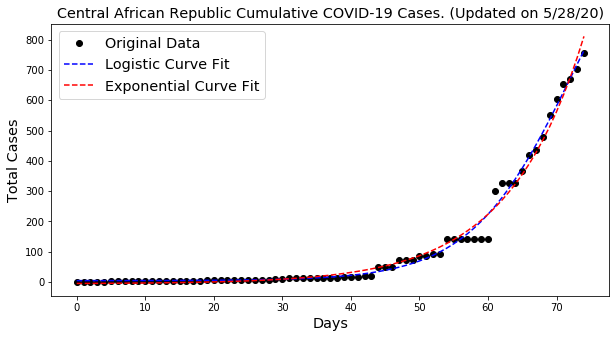



Georgia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 738.0
	Confirmed cases on 5/21/20 	 721.0
	Ratio: 1.02
	Weekly increase: 2.4 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 208.2 days

** Based on Logistic Fit**

	R^2: 0.998947164770391
	Doubling Time (during middle of growth):  16.73 (± 0.55 ) days


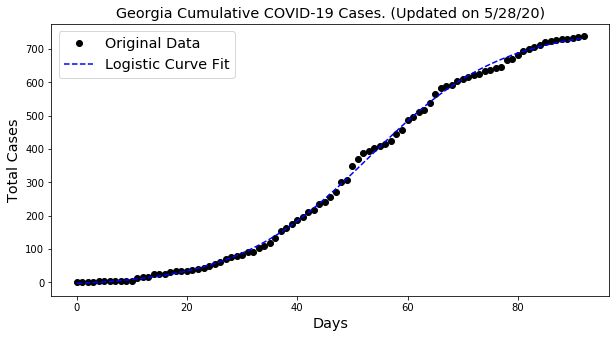



Jordan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 728.0
	Confirmed cases on 5/21/20 	 684.0
	Ratio: 1.06
	Weekly increase: 6.4 %
	Daily increase: 0.9 % per day
	Doubling Time (represents recent growth): 77.8 days

** Based on Logistic Fit**

	R^2: 0.9701295327825538
	Doubling Time (during middle of growth):  195.08 (± 979.75 ) days


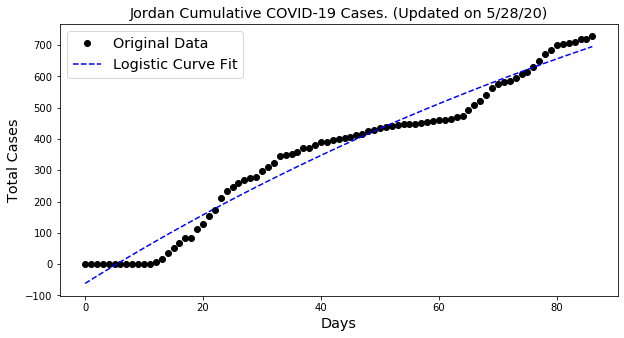



Chad

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 726.0
	Confirmed cases on 5/21/20 	 588.0
	Ratio: 1.23
	Weekly increase: 23.5 %
	Daily increase: 3.1 % per day
	Doubling Time (represents recent growth): 23.0 days

** Based on Logistic Fit**

	R^2: 0.9965520739175839
	Doubling Time (during middle of growth):  8.93 (± 0.6 ) days

** Based on Exponential Fit **

	R^2: 0.970499589444954
	Doubling Time (represents overall growth):  12.36 (± 1.35 ) days


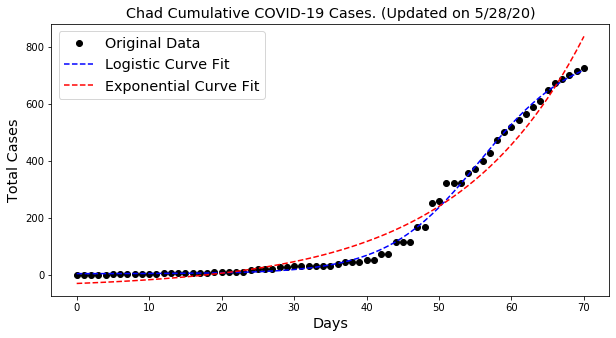



Diamond Princess

** Based on Logistic Fit**

	R^2: 0.9965889752521162
	Doubling Time (during middle of growth):  2.85 (± 0.16 ) days


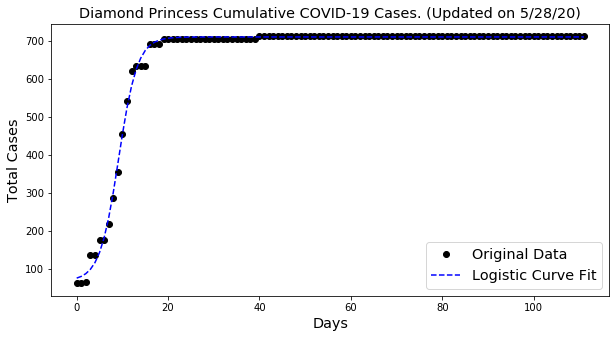



San Marino

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 670.0
	Confirmed cases on 5/21/20 	 658.0
	Ratio: 1.02
	Weekly increase: 1.8 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 268.5 days

** Based on Logistic Fit**

	R^2: 0.9954649053846258
	Doubling Time (during middle of growth):  23.0 (± 1.97 ) days


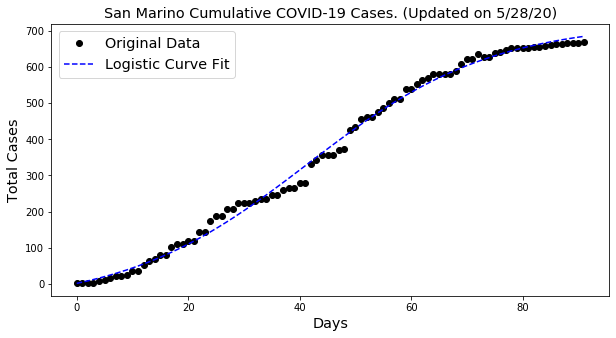



Madagascar

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 656.0
	Confirmed cases on 5/21/20 	 405.0
	Ratio: 1.62
	Weekly increase: 62.0 %
	Daily increase: 7.1 % per day
	Doubling Time (represents recent growth): 10.1 days

** Based on Logistic Fit**

	R^2: 0.9708465903362019
	Doubling Time (during middle of growth):  17.96 (± 3.36 ) days

** Based on Exponential Fit **

	R^2: 0.9708465911978306
	Doubling Time (represents overall growth):  8.98 (± 0.86 ) days


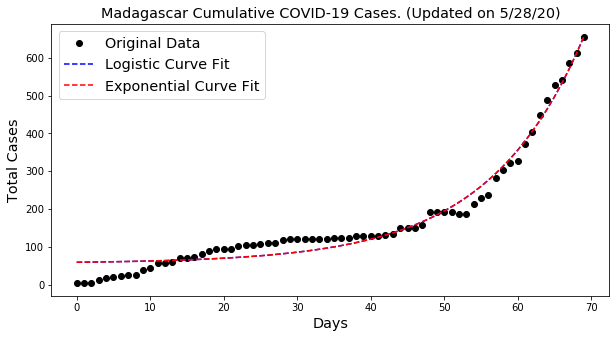



Malta

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 616.0
	Confirmed cases on 5/21/20 	 599.0
	Ratio: 1.03
	Weekly increase: 2.8 %
	Daily increase: 0.4 % per day
	Doubling Time (represents recent growth): 173.4 days

** Based on Logistic Fit**

	R^2: 0.9835316174334012
	Doubling Time (during middle of growth):  21.67 (± 3.99 ) days


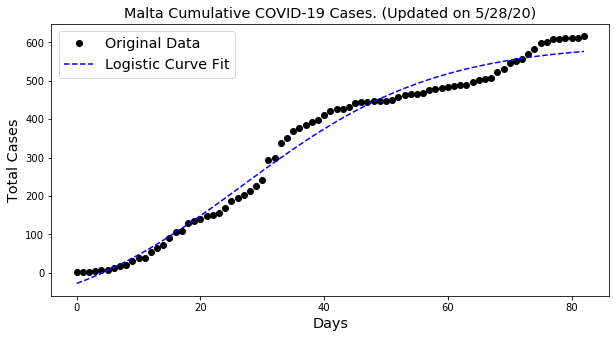



Congo (Brazzaville)

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 571.0
	Confirmed cases on 5/21/20 	 469.0
	Ratio: 1.22
	Weekly increase: 21.7 %
	Daily increase: 2.9 % per day
	Doubling Time (represents recent growth): 24.7 days

** Based on Logistic Fit**

	R^2: 0.9879353146448394
	Doubling Time (during middle of growth):  39.8 (± 17.48 ) days

** Based on Exponential Fit **

	R^2: 0.986931660685195
	Doubling Time (represents overall growth):  25.01 (± 2.75 ) days


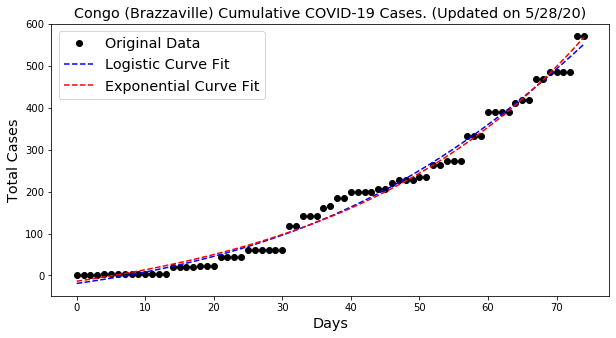



Jamaica

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 569.0
	Confirmed cases on 5/21/20 	 534.0
	Ratio: 1.07
	Weekly increase: 6.6 %
	Daily increase: 0.9 % per day
	Doubling Time (represents recent growth): 76.4 days

** Based on Logistic Fit**

	R^2: 0.996644578763576
	Doubling Time (during middle of growth):  8.31 (± 0.5 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp



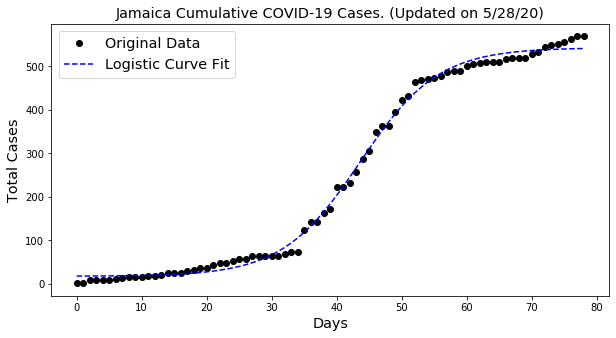



Tanzania

** Based on Logistic Fit**

	R^2: 0.9895629200458433
	Doubling Time (during middle of growth):  6.44 (± 0.74 ) days


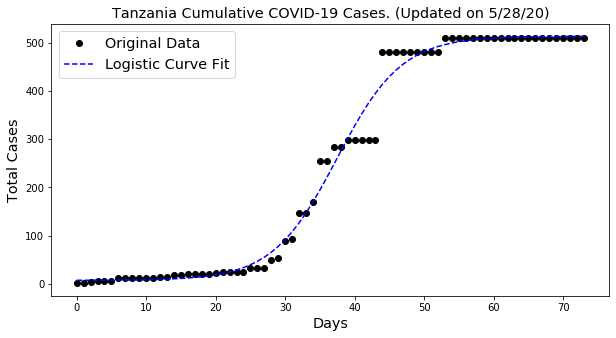



Sao Tome and Principe

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 458.0
	Confirmed cases on 5/21/20 	 251.0
	Ratio: 1.82
	Weekly increase: 82.5 %
	Daily increase: 9.0 % per day
	Doubling Time (represents recent growth): 8.1 days


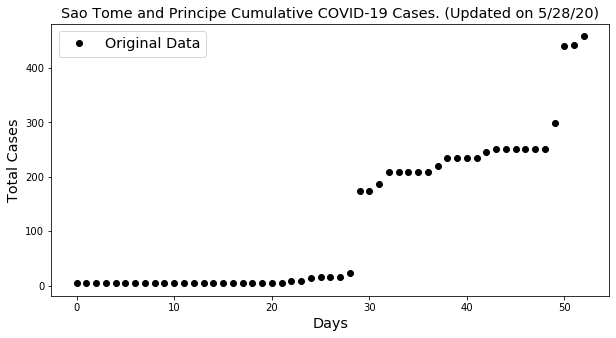



West Bank and Gaza

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 446.0
	Confirmed cases on 5/21/20 	 423.0
	Ratio: 1.05
	Weekly increase: 5.4 %
	Daily increase: 0.8 % per day
	Doubling Time (represents recent growth): 91.6 days

** Based on Logistic Fit**

	R^2: 0.9831653677302019
	Doubling Time (during middle of growth):  13.62 (± 1.84 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp

C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in multiply



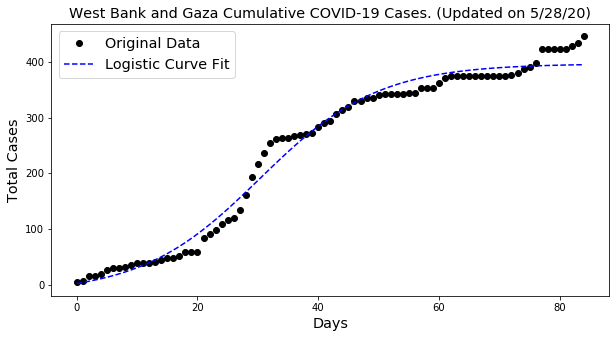



Taiwan*

** Based on Most Recent Week of Data **

	Confirmed cases on 5/28/20 	 441.0
	Confirmed cases on 5/21/20 	 440.0
	Ratio: 1.0
	Weekly increase: 0.2 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 2137.3 days

** Based on Logistic Fit**

	R^2: 0.9965375008041445
	Doubling Time (during middle of growth):  8.86 (± 0.47 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp

C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in multiply



OSError: [Errno 22] Invalid argument: 'Figures/WW/CurveFitting_Taiwan*.png'

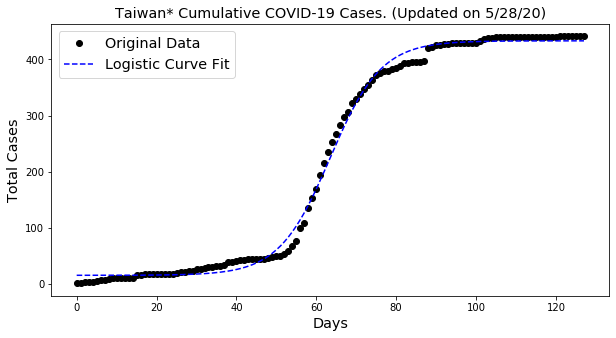

In [29]:
topcountries = cases.index
inferreddoublingtime = []
recentdoublingtime = []
errors = []
countries = []
print('\n')

for c in topcountries:
    print(c)
    a = plotCases(dataCOV, 'Country/Region', c)
    if a:
        countries.append(c)
        inferreddoublingtime.append(a[0])
        errors.append(a[1])
        recentdoublingtime.append(a[2])
    print('\n')